# Implementation of CNFs

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"

In [2]:
import sys
N_up = 1
repo_dir = '/'.join(os.getcwd().split('/')[:-N_up])
if repo_dir not in sys.path:
    sys.path.append(repo_dir)

In [3]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [4]:
import numpy as np

from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from src.cnf import CNF
from torchdiffeq import odeint_adjoint as odeint

import matplotlib.pyplot as plt

from sklearn.datasets import make_moons, make_circles

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Create and train a CNF on the half moons dataset

### Define data

In [8]:
norm = torch.distributions.MultivariateNormal(loc=torch.tensor([0.0, 0.0]).to(device), 
                                              covariance_matrix=torch.tensor([[1.0, 0.0], [0.0, 1.0]]).to(device))

In [9]:
num_samples = 512

def get_batch(num_samples, ret_classes=False):
    points, classes = make_moons(n_samples=num_samples, noise=0.08)
    x = torch.tensor(points).type(torch.float32).to(device)
    logp_diff_t1 = torch.zeros(num_samples, 1).type(torch.float32).to(device)
    
    if ret_classes:
        return(x, logp_diff_t1, classes)
    return(x, logp_diff_t1)

In [10]:
x_test, logp_diff_t1_test, classes = get_batch(num_samples, True)

In [11]:
t0 = 0
t1 = 10

In [107]:
np.mean(points, axis=0)


array([-3.94771623e-15, -1.01818369e-15])

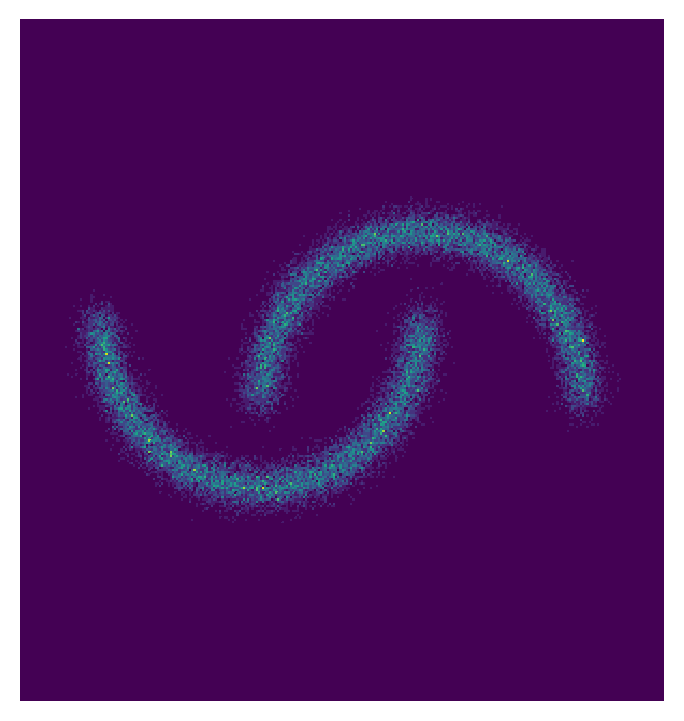

In [23]:
points, _ = make_moons(n_samples=30000, noise=0.07)
points = (points - [0.5, 0.25])
plt.figure(figsize=(4, 4), dpi=200)

plt.hist2d(*points.T, bins=300, density=True, range=[[-2, 2], [-2, 2]])

plt.tight_layout()
plt.axis('off')
plt.gca().invert_yaxis()
plt.margins(0, 0)

plt.savefig(repo_dir + f"/moons.jpg",
            pad_inches=0, bbox_inches='tight')

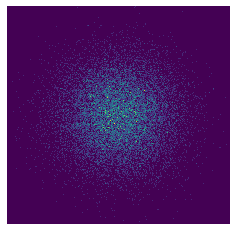

In [141]:
p0 = torch.distributions.MultivariateNormal(loc=torch.tensor([0.0, 0.0]).to(device), 
                                              covariance_matrix=torch.tensor([[0.3, 0.0], [0.0, 0.3]]).to(device))
points = p0.sample([30000]).detach().cpu().numpy()
plt.figure(figsize=(4, 4))
plt.hist2d(*points.T, bins=300, density=True, range=[[-2, 2], [-2, 2]])
# plt.tight_layout()
plt.axis('off')
plt.gca().invert_yaxis()

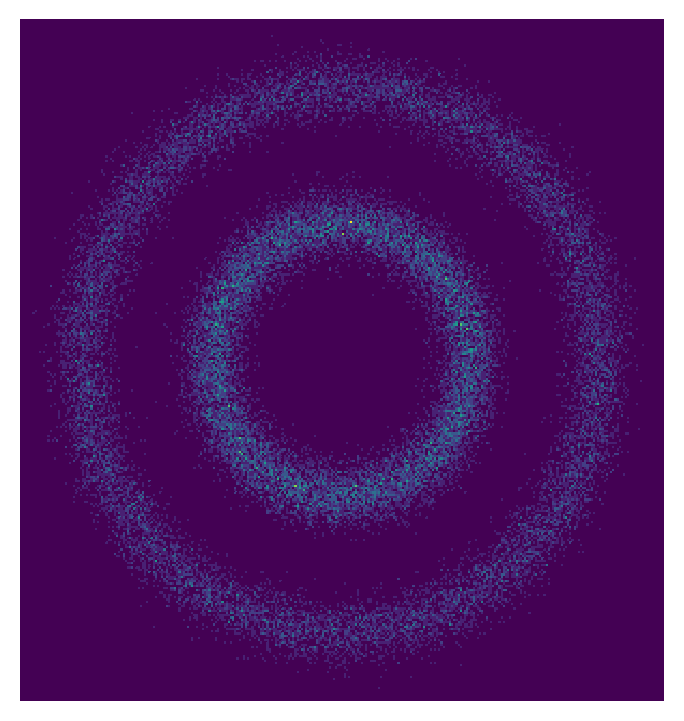

In [22]:
points, _ = make_circles(n_samples=30000, noise=0.06, factor=0.5)
points = points * 2 / 1.25
plt.figure(figsize=(4, 4), dpi=200)

plt.hist2d(*points.T, bins=300, density=True, range=[[-2, 2], [-2, 2]])

plt.tight_layout()
plt.axis('off')
plt.gca().invert_yaxis()
plt.margins(0, 0)

plt.savefig(repo_dir + f"/circles.jpg",
            pad_inches=0, bbox_inches='tight')

### Define model

In [11]:
odefunc = CNF(in_out_dim=2, hidden_dim=32, width=64)
# ^ have to guess hidden_dim

if device != "cpu":
    odefunc = odefunc.cuda()

In [12]:
optimizer = optim.Adam(odefunc.parameters(), lr=1e-3, weight_decay=0.)
# have to guess the LR (should check FFJORD paper)

In [13]:
def calc_loss(x, logp_diff_t1):
    z_t, logp_diff_t = odeint(
            odefunc,
            (x, logp_diff_t1),
            torch.tensor([t1, t0]).type(torch.float32).to(device),
            atol=1e-5,
            rtol=1e-5,
            method='dopri5',
        )

    z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]

#     loss = -logp_diff_t0 - pz0(z_t0)
#     loss = -pz0(z_t0) + logp_diff_t0
    
    logp_x =  norm.log_prob(z_t0).to(device) - logp_diff_t0.view(-1)
    
    loss = -logp_x.mean(0)

    return loss

### Train

  0%|          | 0/1100 [00:00<?, ?it/s]

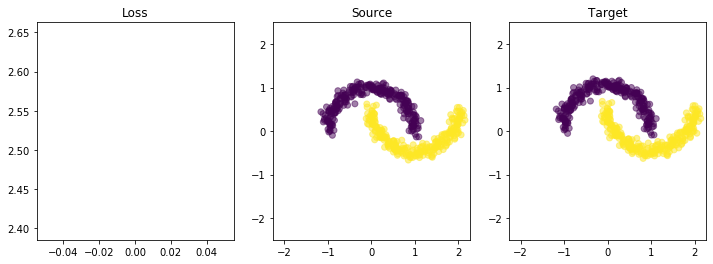

  1%|          | 10/1100 [00:04<07:12,  2.52it/s]

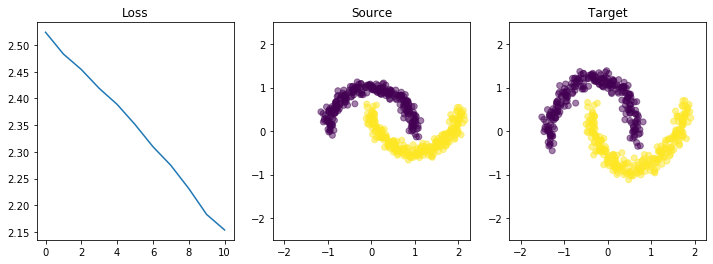

  2%|▏         | 20/1100 [00:08<06:54,  2.60it/s]

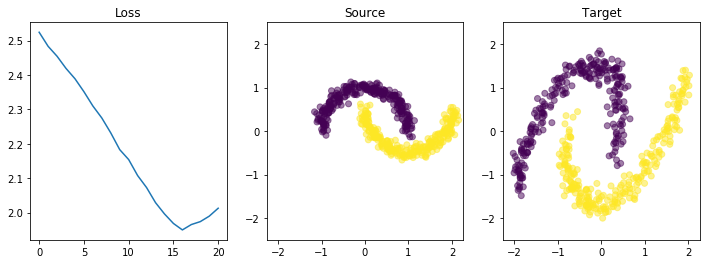

  3%|▎         | 30/1100 [00:12<07:00,  2.55it/s]

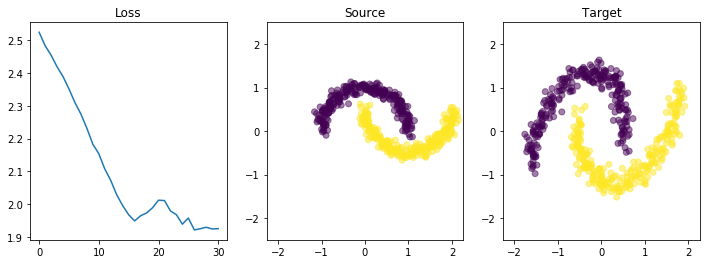

  4%|▎         | 40/1100 [00:17<07:21,  2.40it/s]

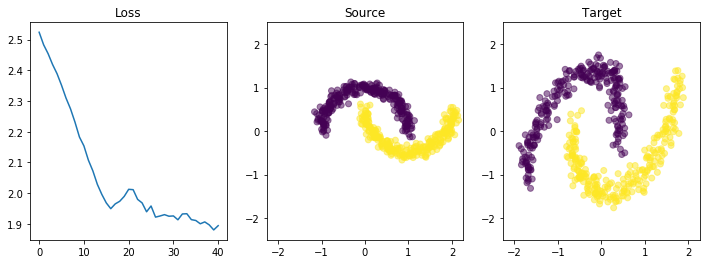

  5%|▍         | 50/1100 [00:22<07:09,  2.45it/s]

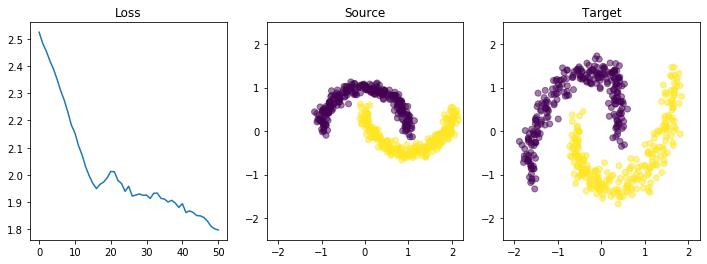

  5%|▌         | 60/1100 [00:26<07:24,  2.34it/s]

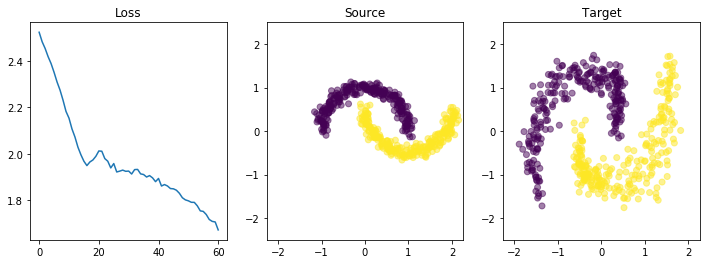

  6%|▋         | 70/1100 [00:31<07:36,  2.26it/s]

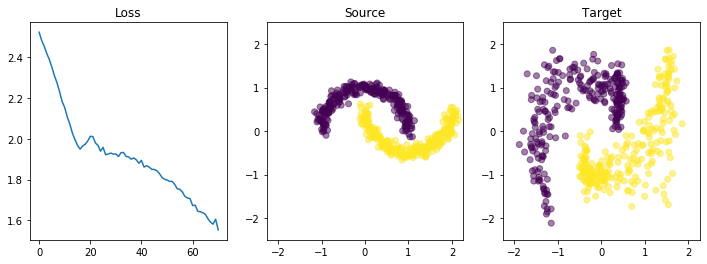

  7%|▋         | 80/1100 [00:36<08:15,  2.06it/s]

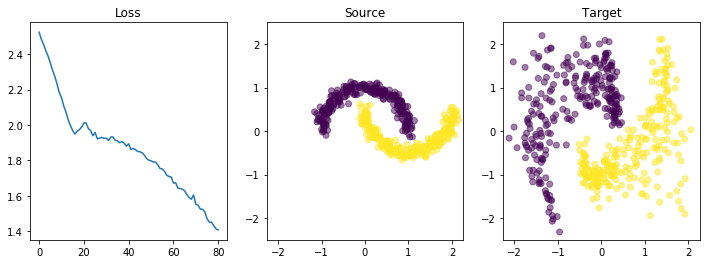

  8%|▊         | 90/1100 [00:42<08:32,  1.97it/s]

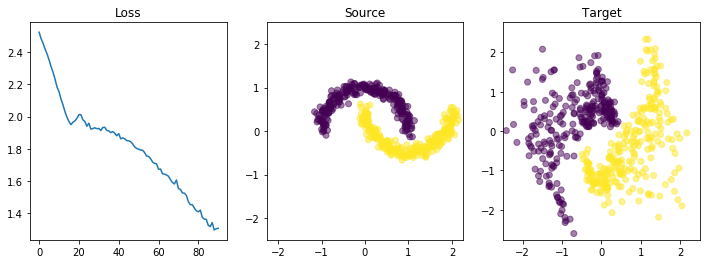

  9%|▉         | 100/1100 [00:48<08:29,  1.96it/s]

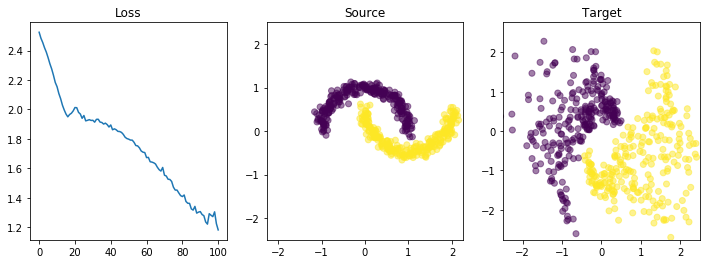

 10%|█         | 110/1100 [00:54<08:45,  1.88it/s]

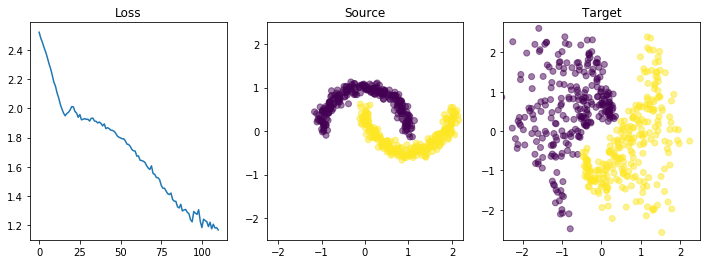

 11%|█         | 120/1100 [00:59<08:43,  1.87it/s]

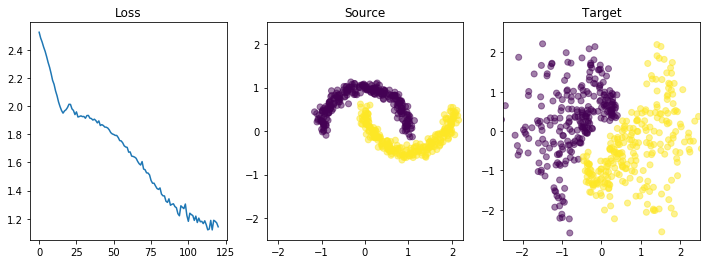

 12%|█▏        | 130/1100 [01:05<08:42,  1.86it/s]

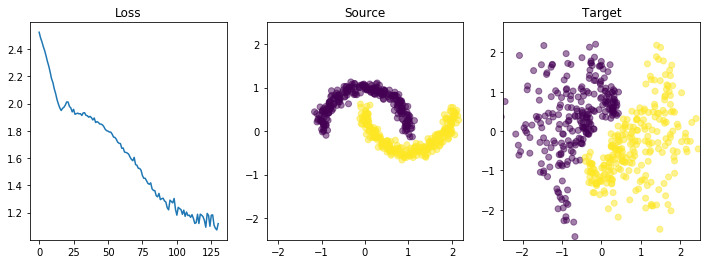

 13%|█▎        | 140/1100 [01:11<08:31,  1.88it/s]

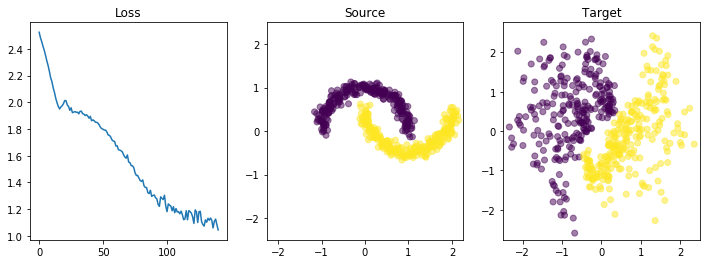

 14%|█▎        | 150/1100 [01:17<08:41,  1.82it/s]

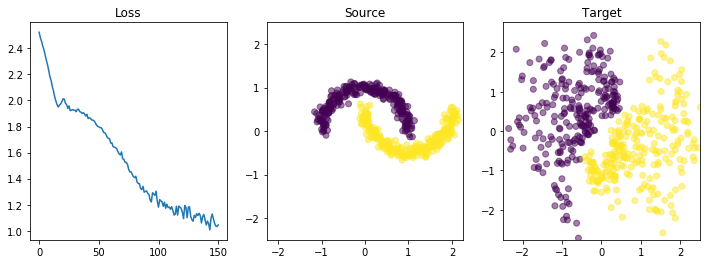

 15%|█▍        | 160/1100 [01:24<08:40,  1.81it/s]

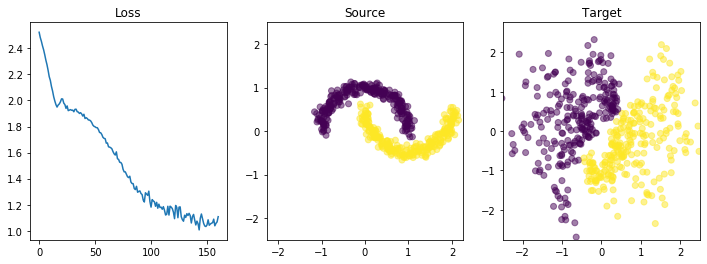

 15%|█▌        | 170/1100 [01:29<08:14,  1.88it/s]

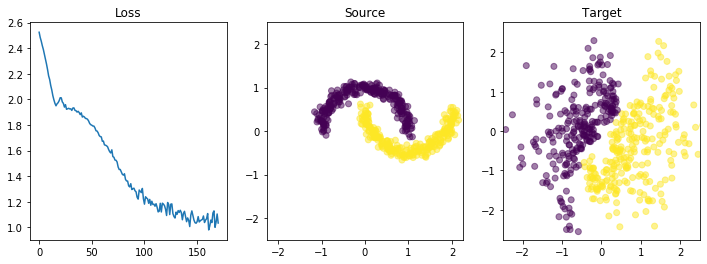

 16%|█▋        | 180/1100 [01:35<08:21,  1.83it/s]

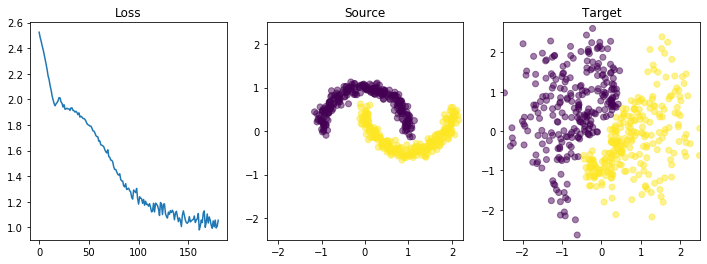

 17%|█▋        | 190/1100 [01:41<08:06,  1.87it/s]

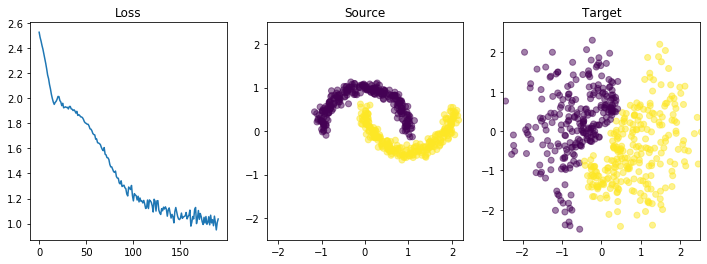

 18%|█▊        | 200/1100 [01:47<08:03,  1.86it/s]

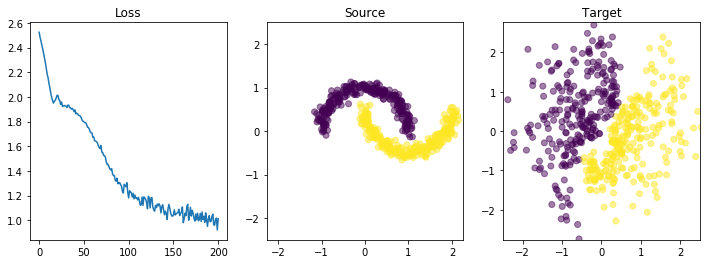

 19%|█▉        | 210/1100 [01:53<08:07,  1.82it/s]

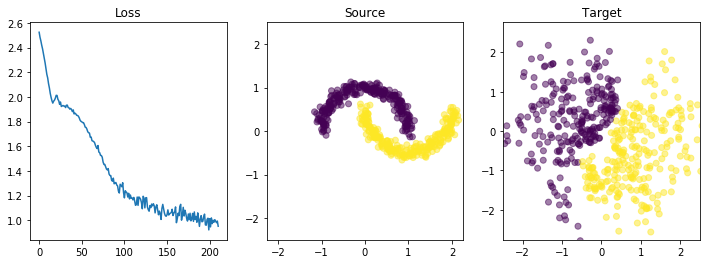

 20%|██        | 220/1100 [01:59<08:13,  1.78it/s]

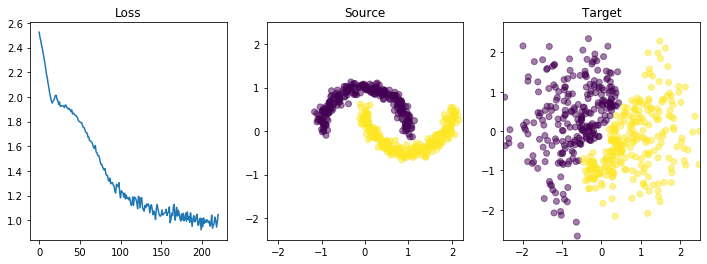

 21%|██        | 230/1100 [02:06<08:29,  1.71it/s]

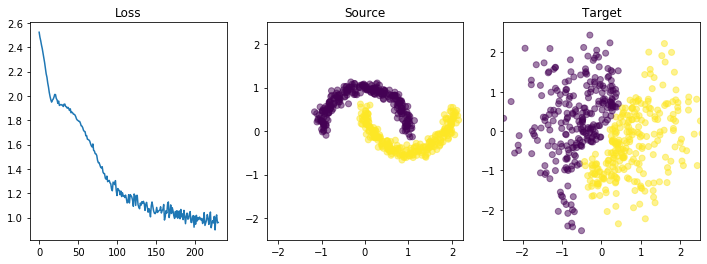

 22%|██▏       | 240/1100 [02:12<08:18,  1.72it/s]

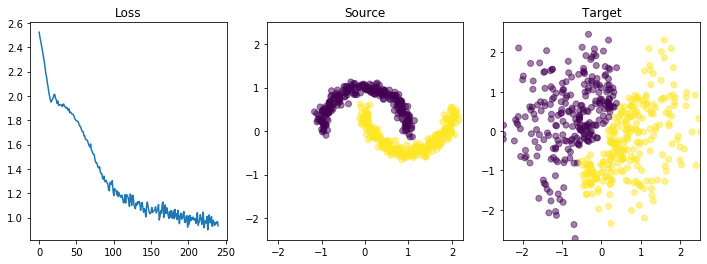

 23%|██▎       | 250/1100 [02:19<08:22,  1.69it/s]

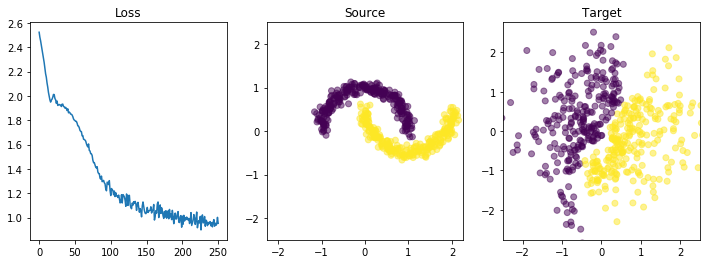

 24%|██▎       | 260/1100 [02:25<08:12,  1.70it/s]

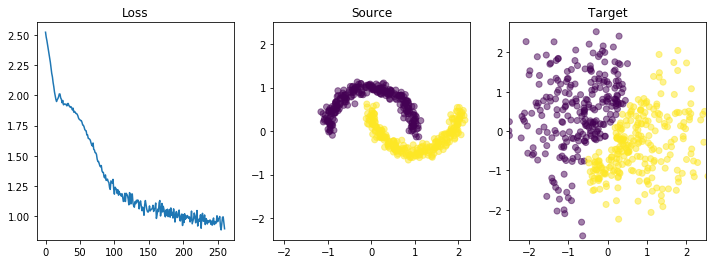

 25%|██▍       | 270/1100 [02:32<08:26,  1.64it/s]

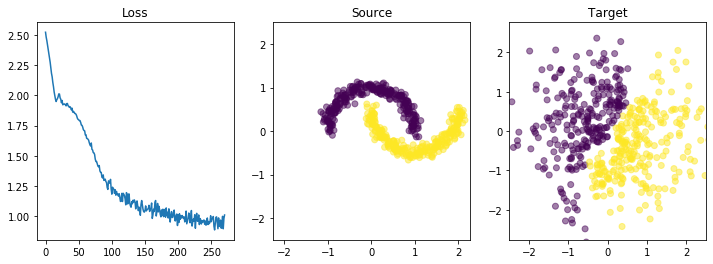

 25%|██▌       | 280/1100 [02:38<08:08,  1.68it/s]

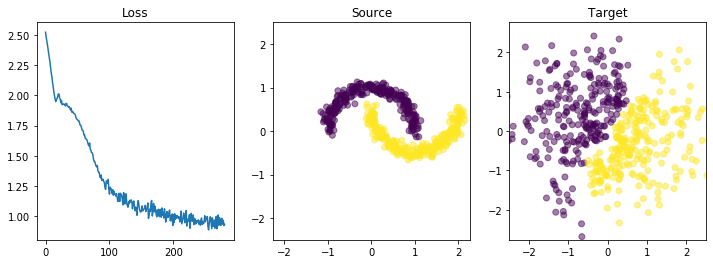

 26%|██▋       | 290/1100 [02:45<08:17,  1.63it/s]

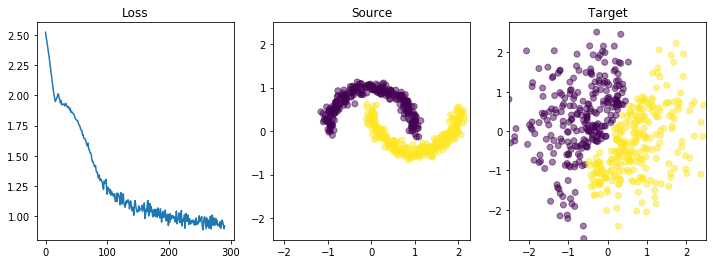

 27%|██▋       | 300/1100 [02:52<08:16,  1.61it/s]

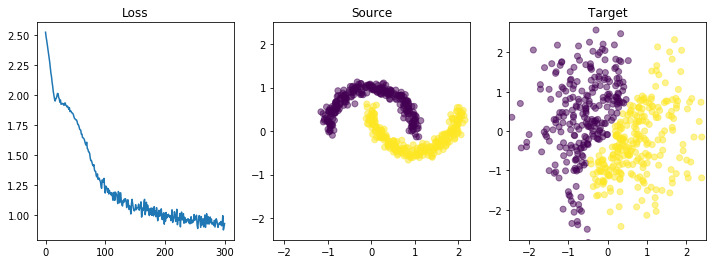

 28%|██▊       | 310/1100 [02:59<08:24,  1.57it/s]

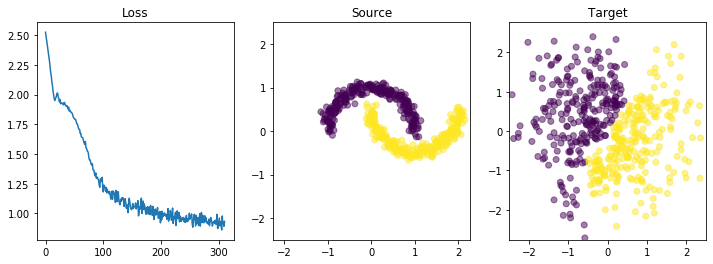

 29%|██▉       | 320/1100 [03:06<08:03,  1.61it/s]

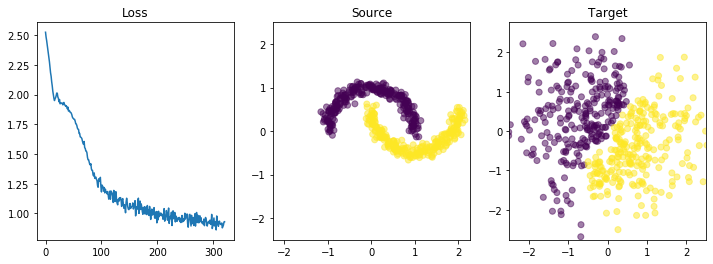

 30%|███       | 330/1100 [03:12<08:12,  1.56it/s]

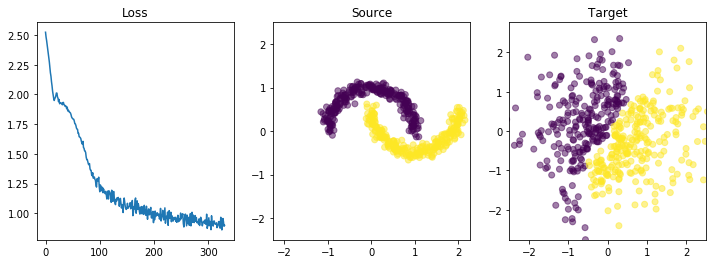

 31%|███       | 340/1100 [03:20<08:23,  1.51it/s]

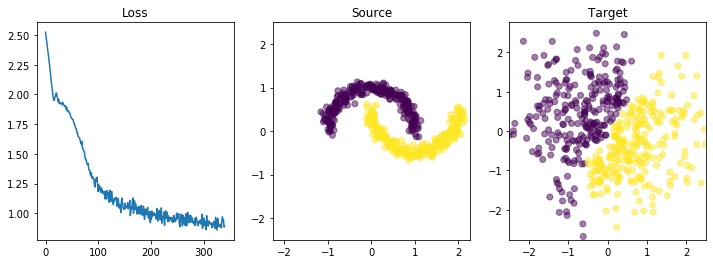

 32%|███▏      | 350/1100 [03:27<08:31,  1.47it/s]

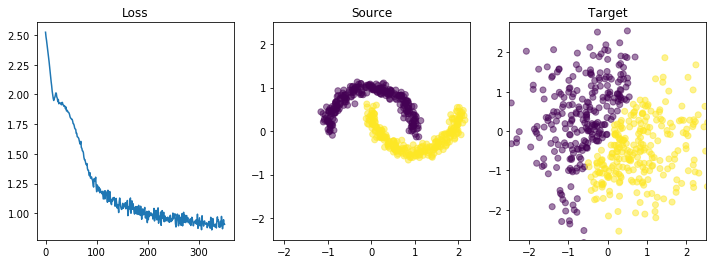

 33%|███▎      | 360/1100 [03:35<08:10,  1.51it/s]

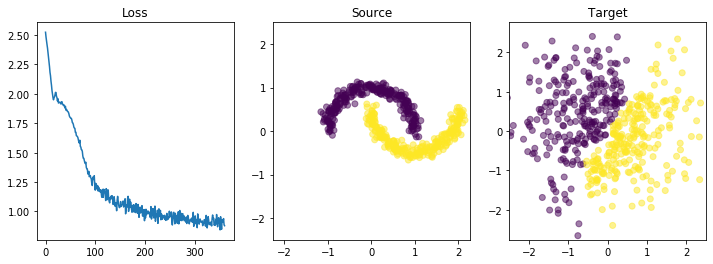

 34%|███▎      | 370/1100 [03:42<08:14,  1.48it/s]

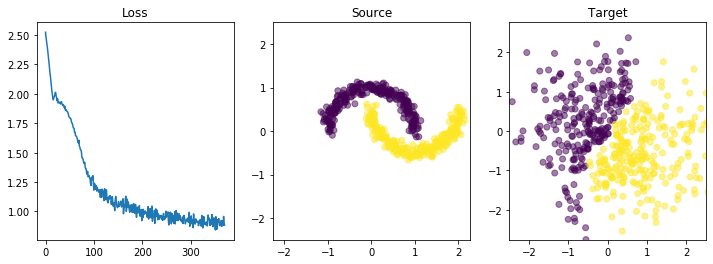

 35%|███▍      | 380/1100 [03:49<08:11,  1.46it/s]

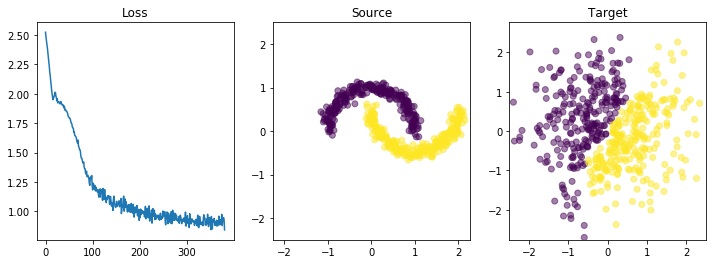

 35%|███▌      | 390/1100 [03:57<08:04,  1.46it/s]

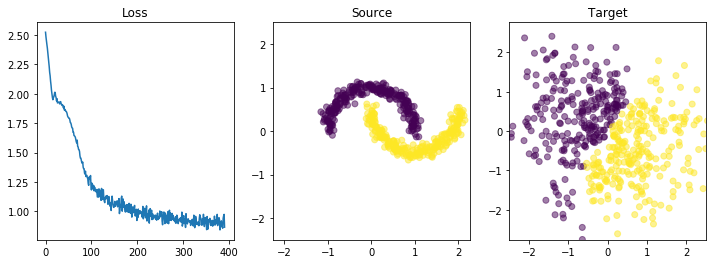

 36%|███▋      | 400/1100 [04:04<08:00,  1.46it/s]

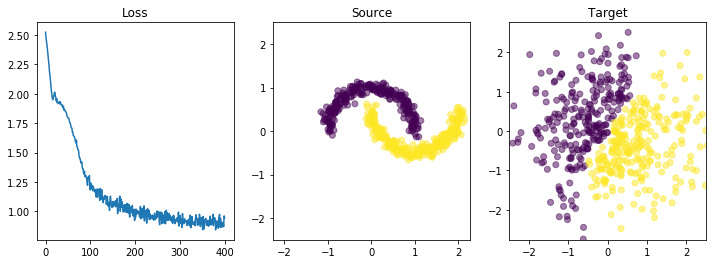

 37%|███▋      | 410/1100 [04:12<08:01,  1.43it/s]

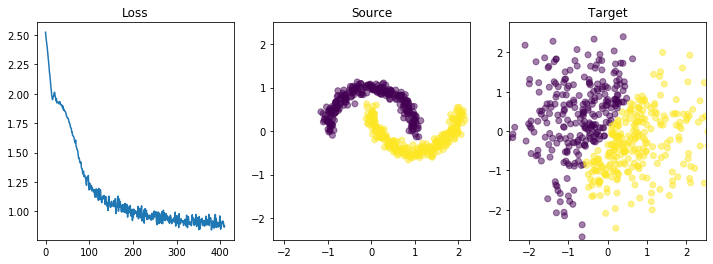

 38%|███▊      | 420/1100 [04:19<07:51,  1.44it/s]

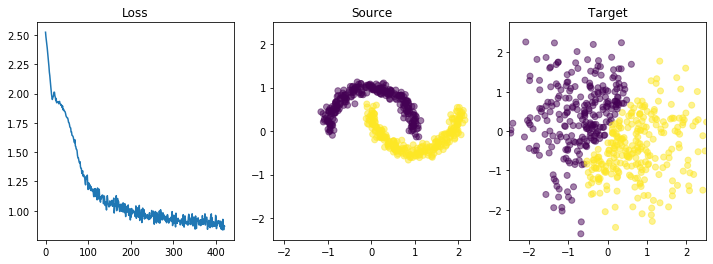

 39%|███▉      | 430/1100 [04:27<08:12,  1.36it/s]

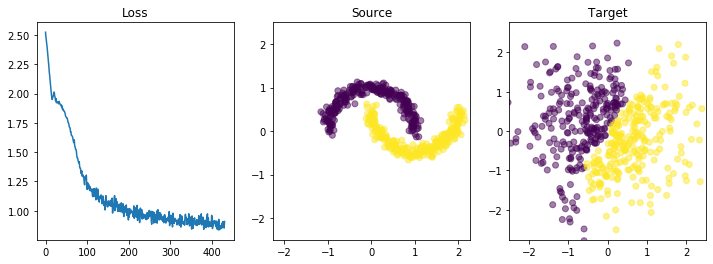

 40%|████      | 440/1100 [04:35<07:59,  1.38it/s]

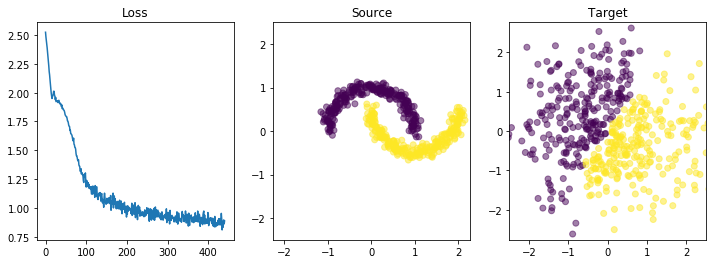

 41%|████      | 450/1100 [04:43<07:26,  1.46it/s]

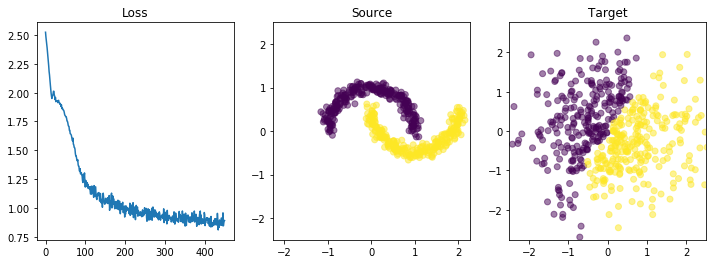

 42%|████▏     | 460/1100 [04:51<07:39,  1.39it/s]

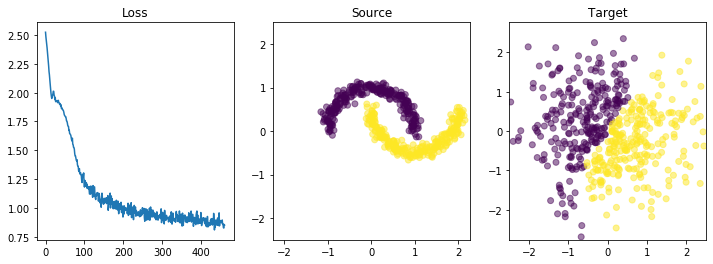

 43%|████▎     | 470/1100 [04:59<07:48,  1.35it/s]

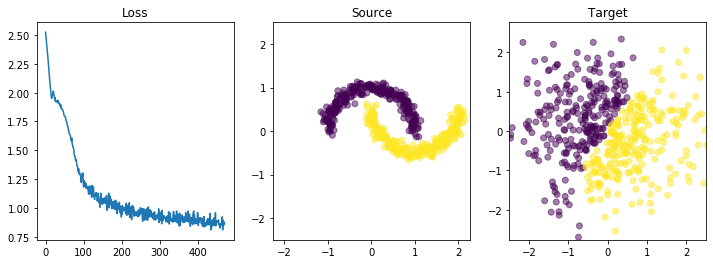

 44%|████▎     | 480/1100 [05:07<07:47,  1.33it/s]

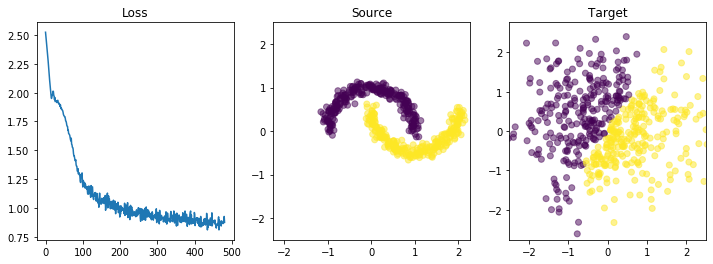

 45%|████▍     | 490/1100 [05:15<07:48,  1.30it/s]

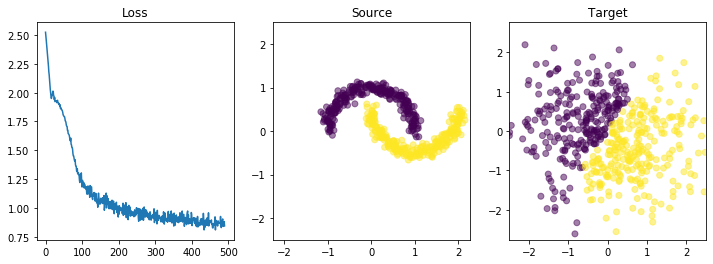

 45%|████▌     | 500/1100 [05:24<07:38,  1.31it/s]

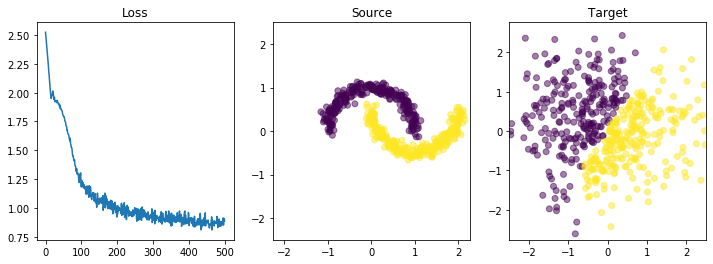

 46%|████▋     | 510/1100 [05:32<07:25,  1.32it/s]

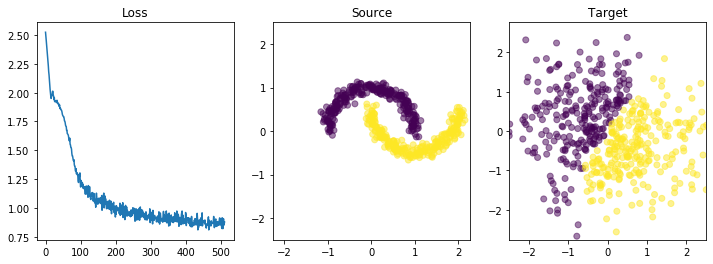

 47%|████▋     | 520/1100 [05:41<07:31,  1.28it/s]

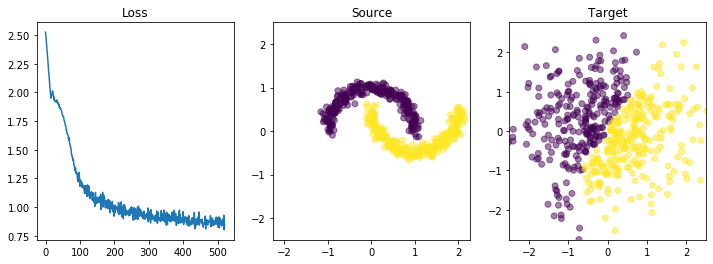

 48%|████▊     | 530/1100 [05:49<07:18,  1.30it/s]

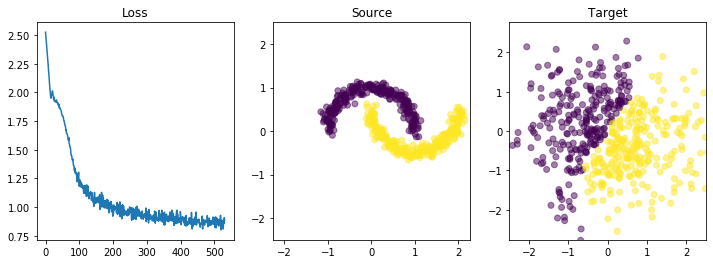

 49%|████▉     | 540/1100 [05:58<07:42,  1.21it/s]

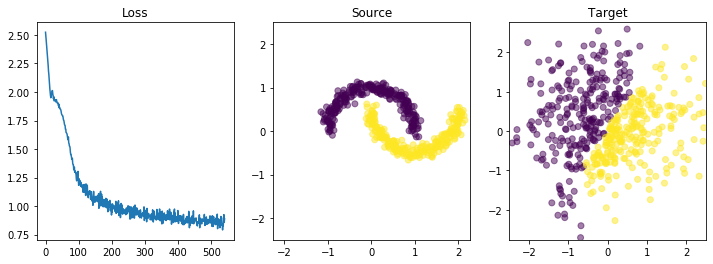

 50%|█████     | 550/1100 [06:06<07:23,  1.24it/s]

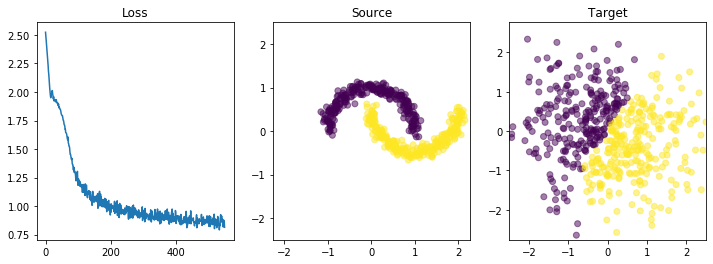

 51%|█████     | 560/1100 [06:15<07:23,  1.22it/s]

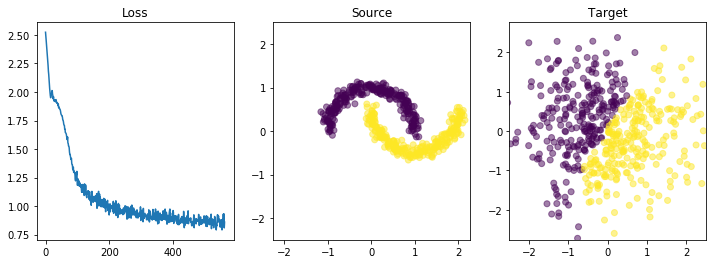

 52%|█████▏    | 570/1100 [06:24<07:20,  1.20it/s]

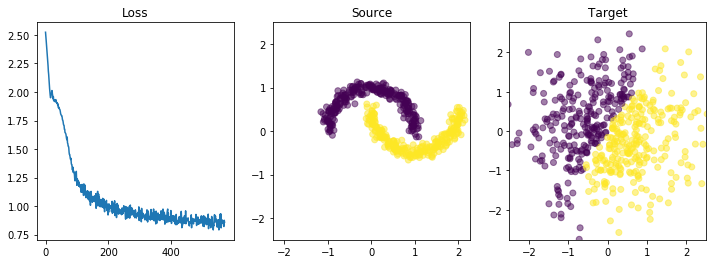

 53%|█████▎    | 580/1100 [06:33<07:09,  1.21it/s]

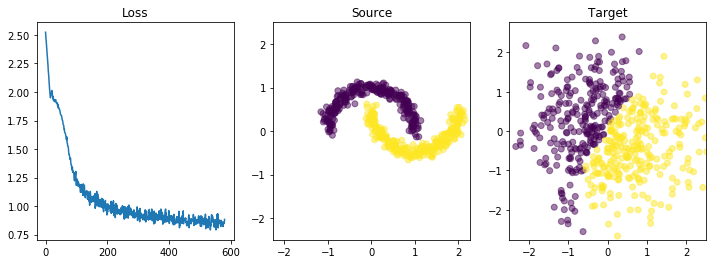

 54%|█████▎    | 590/1100 [06:42<07:03,  1.20it/s]

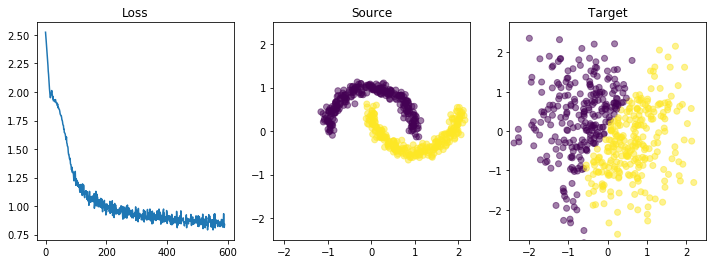

 55%|█████▍    | 600/1100 [06:51<06:52,  1.21it/s]

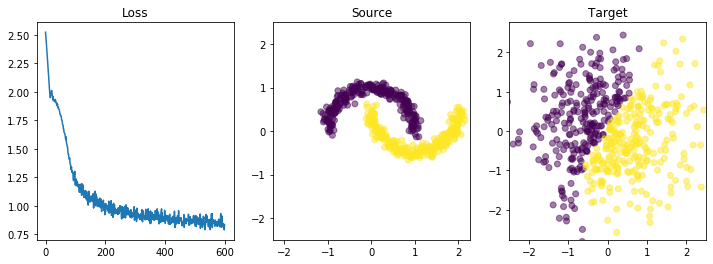

 55%|█████▌    | 610/1100 [07:00<06:52,  1.19it/s]

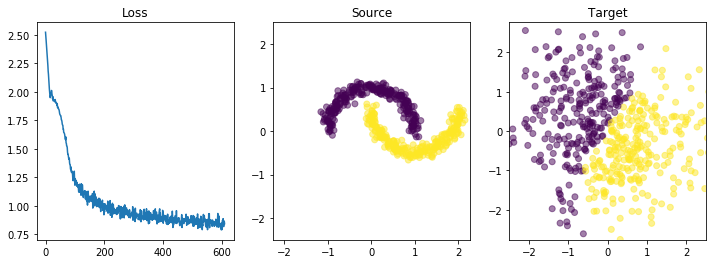

 56%|█████▋    | 620/1100 [07:09<06:25,  1.24it/s]

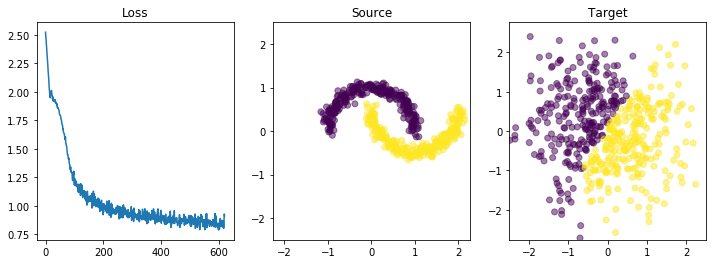

 57%|█████▋    | 630/1100 [07:18<06:39,  1.18it/s]

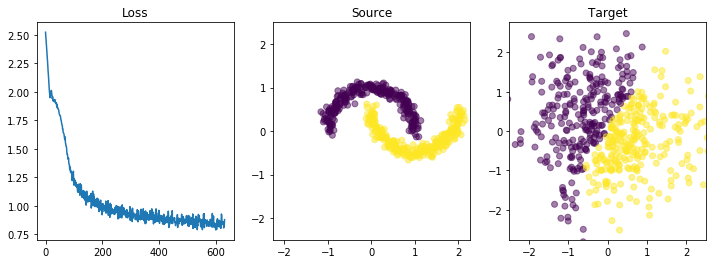

 58%|█████▊    | 640/1100 [07:28<06:43,  1.14it/s]

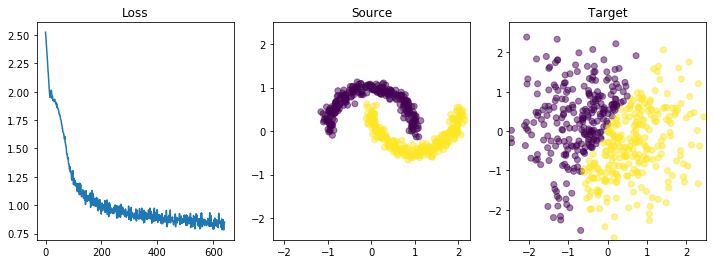

 59%|█████▉    | 650/1100 [07:37<06:32,  1.15it/s]

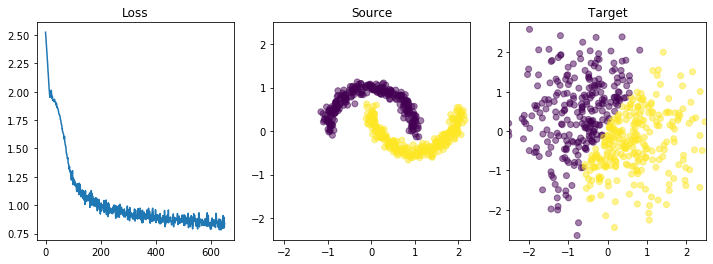

 60%|██████    | 660/1100 [07:46<06:11,  1.18it/s]

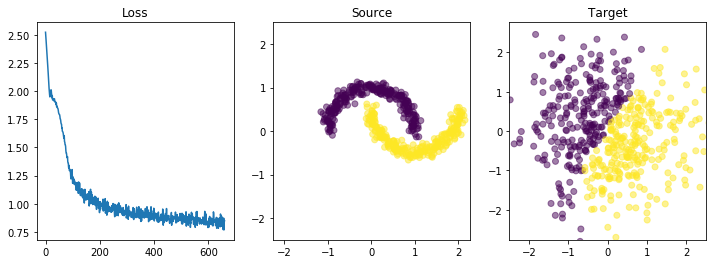

 61%|██████    | 670/1100 [07:56<06:12,  1.15it/s]

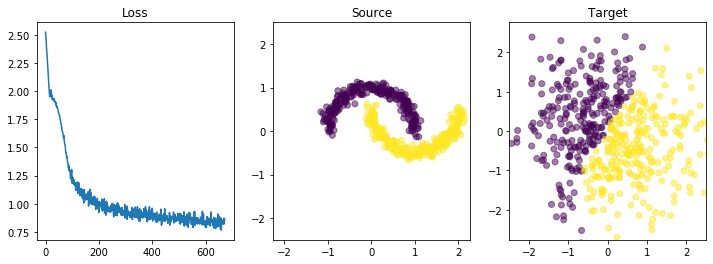

 62%|██████▏   | 680/1100 [08:05<06:03,  1.16it/s]

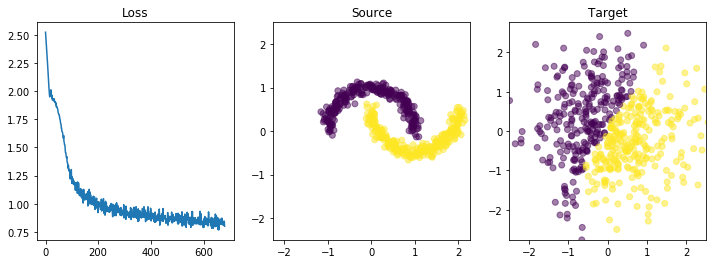

 63%|██████▎   | 690/1100 [08:15<06:09,  1.11it/s]

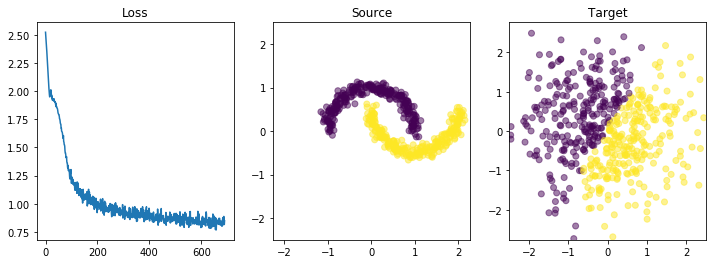

 64%|██████▎   | 700/1100 [08:24<05:53,  1.13it/s]

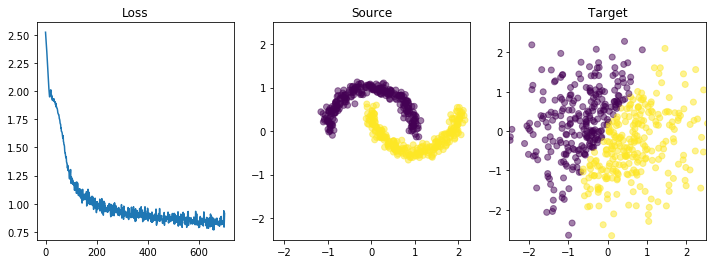

 65%|██████▍   | 710/1100 [08:33<05:42,  1.14it/s]

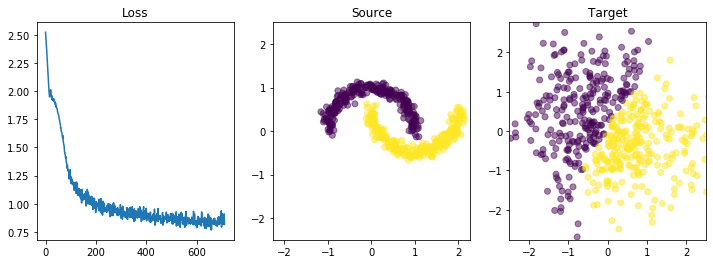

 65%|██████▌   | 720/1100 [08:43<06:01,  1.05it/s]

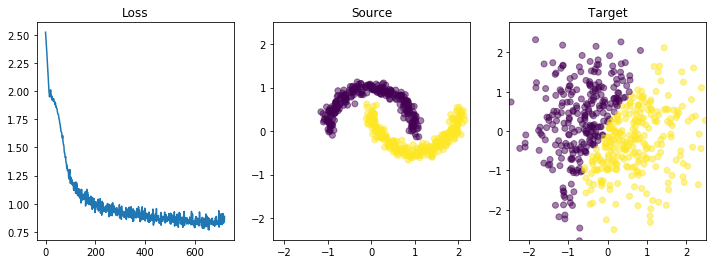

 66%|██████▋   | 730/1100 [08:53<05:37,  1.10it/s]

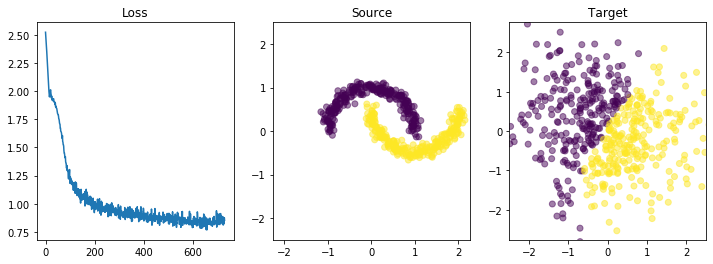

 67%|██████▋   | 740/1100 [09:03<05:23,  1.11it/s]

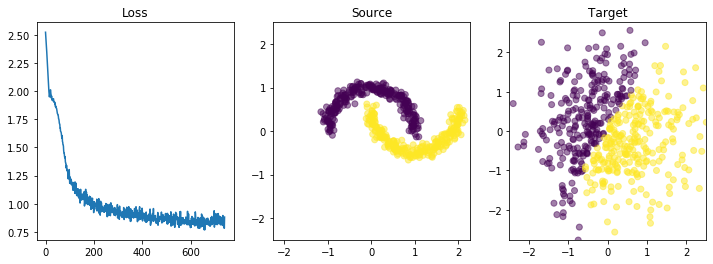

 68%|██████▊   | 750/1100 [09:12<05:03,  1.15it/s]

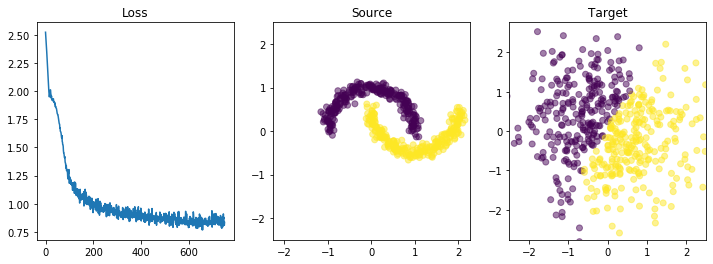

 69%|██████▉   | 760/1100 [09:22<05:04,  1.12it/s]

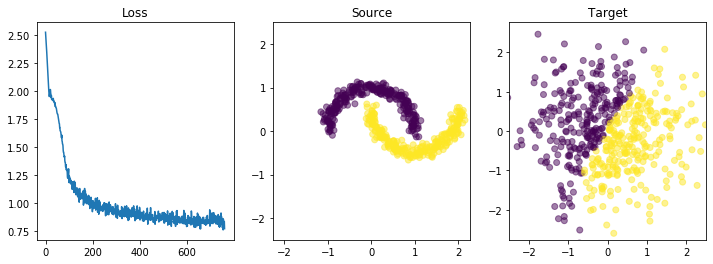

 70%|███████   | 770/1100 [09:32<04:53,  1.13it/s]

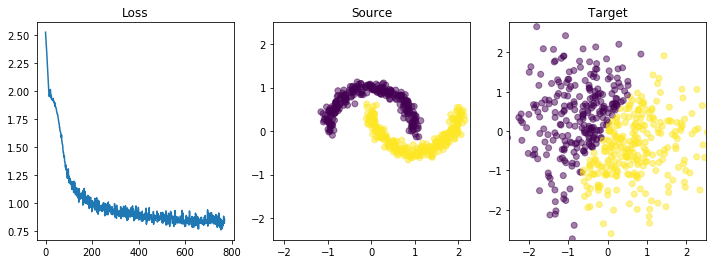

 71%|███████   | 780/1100 [09:42<05:11,  1.03it/s]

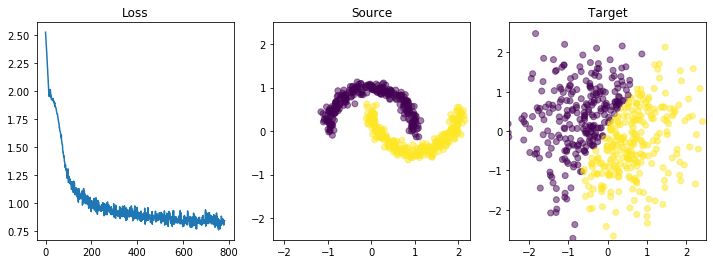

 72%|███████▏  | 790/1100 [09:52<04:52,  1.06it/s]

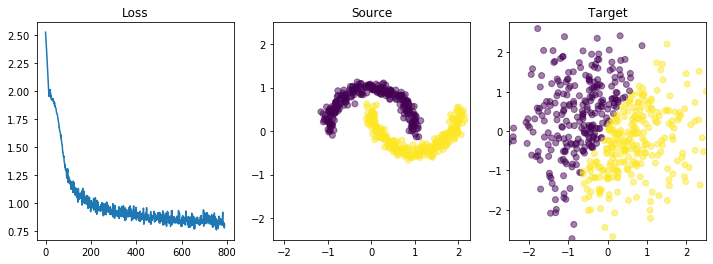

 73%|███████▎  | 800/1100 [10:02<04:36,  1.09it/s]

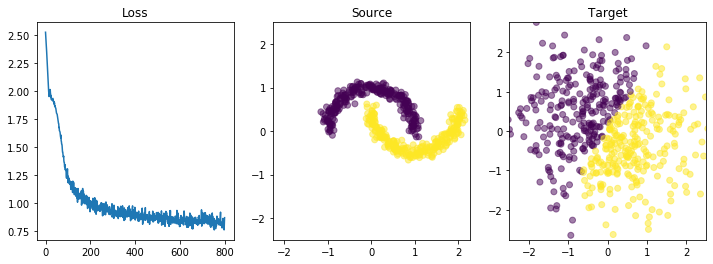

 74%|███████▎  | 810/1100 [10:12<04:38,  1.04it/s]

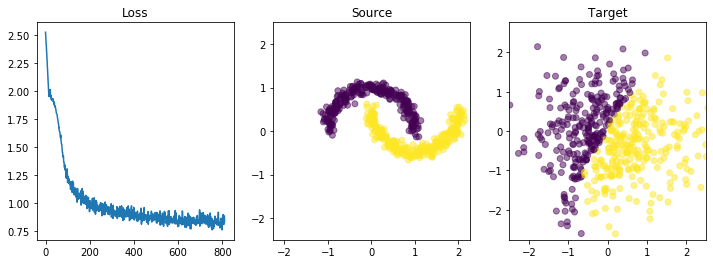

 75%|███████▍  | 820/1100 [10:22<04:30,  1.03it/s]

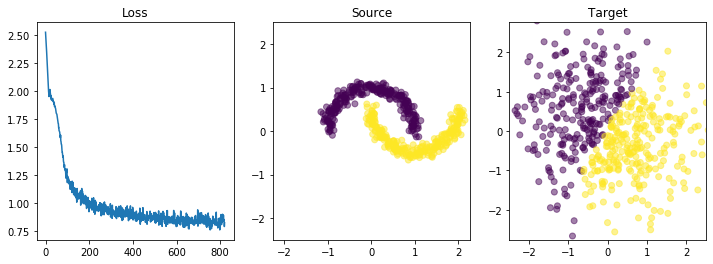

 75%|███████▌  | 830/1100 [10:32<04:16,  1.05it/s]

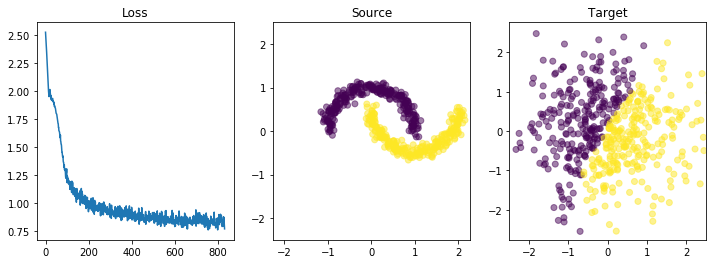

 76%|███████▋  | 840/1100 [10:42<04:05,  1.06it/s]

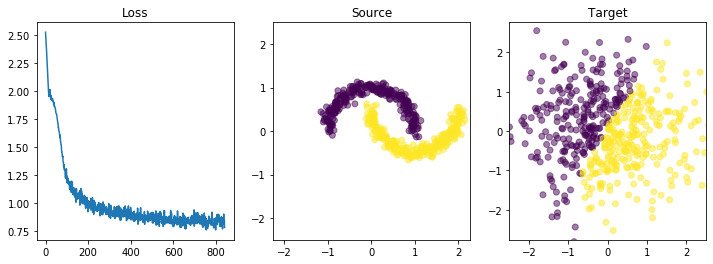

 77%|███████▋  | 850/1100 [10:52<03:50,  1.09it/s]

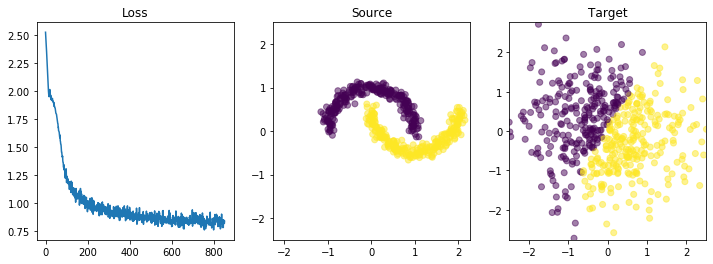

 78%|███████▊  | 860/1100 [11:03<03:46,  1.06it/s]

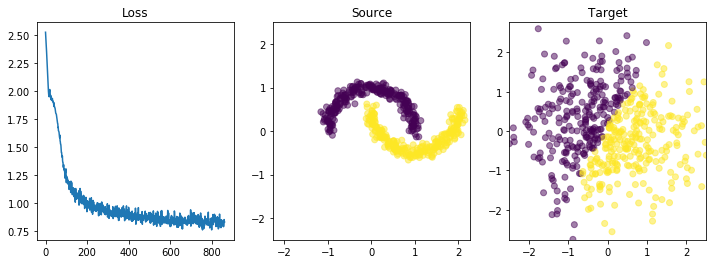

 79%|███████▉  | 870/1100 [11:13<03:37,  1.06it/s]

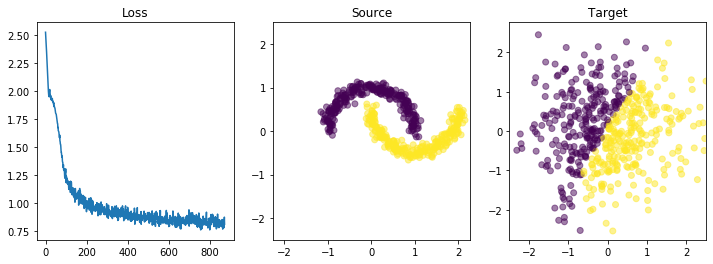

 80%|████████  | 880/1100 [11:23<03:29,  1.05it/s]

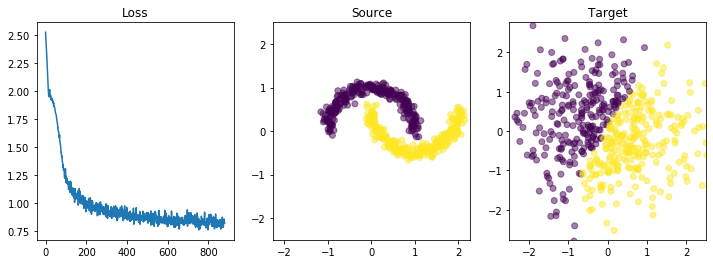

 81%|████████  | 890/1100 [11:34<03:26,  1.02it/s]

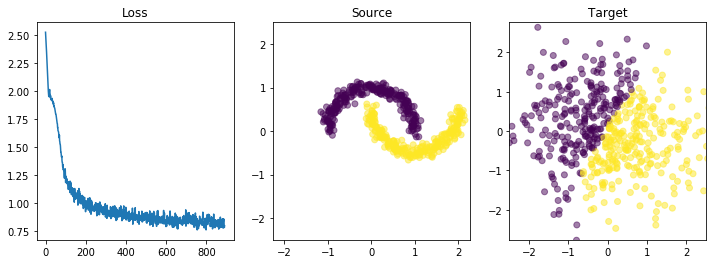

 82%|████████▏ | 900/1100 [11:44<03:14,  1.03it/s]

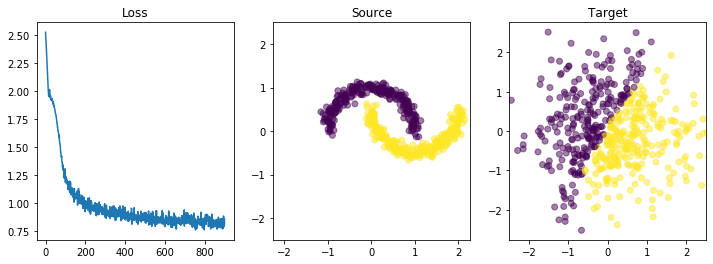

 83%|████████▎ | 910/1100 [11:54<02:59,  1.06it/s]

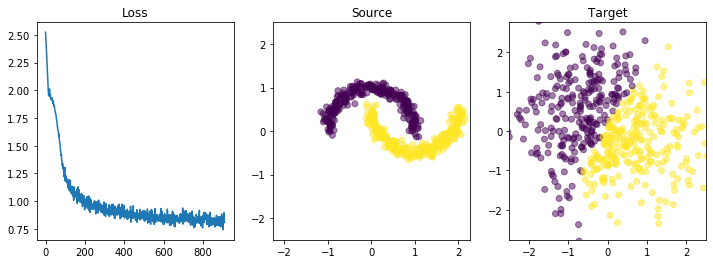

 84%|████████▎ | 920/1100 [12:04<02:56,  1.02it/s]

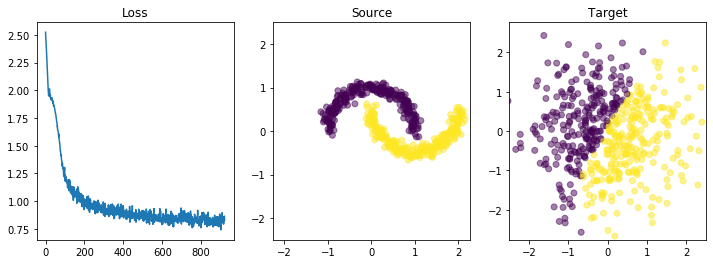

 85%|████████▍ | 930/1100 [12:15<02:37,  1.08it/s]

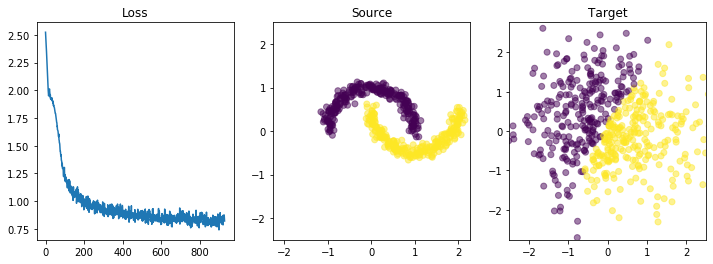

 85%|████████▌ | 940/1100 [12:25<02:37,  1.02it/s]

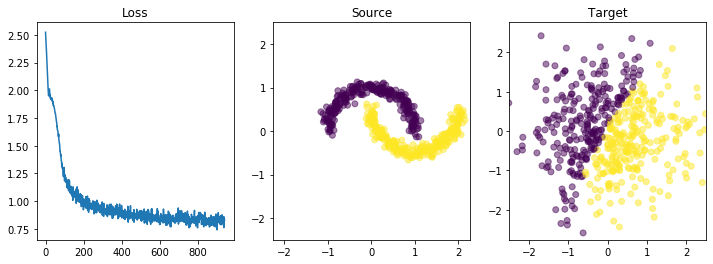

 86%|████████▋ | 950/1100 [12:35<02:29,  1.00it/s]

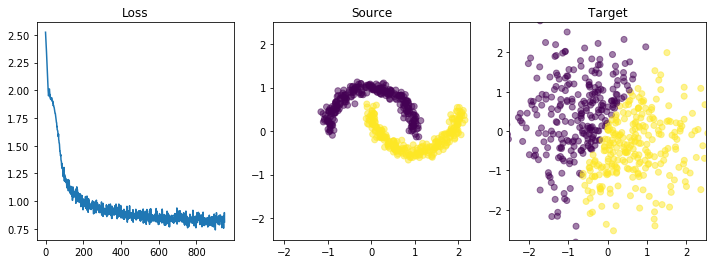

 87%|████████▋ | 960/1100 [12:46<02:12,  1.06it/s]

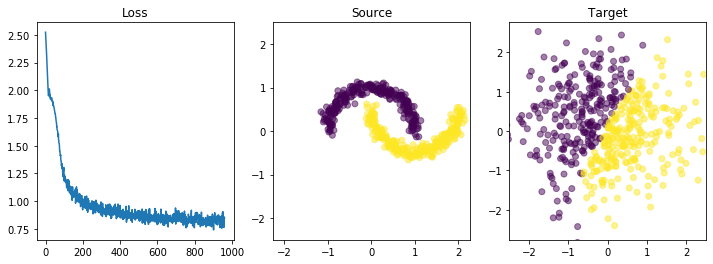

 88%|████████▊ | 970/1100 [12:56<02:09,  1.00it/s]

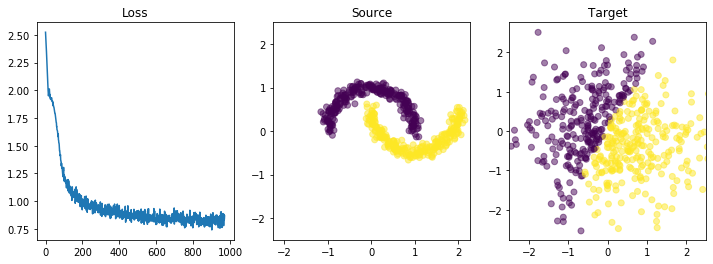

 89%|████████▉ | 980/1100 [13:06<01:55,  1.04it/s]

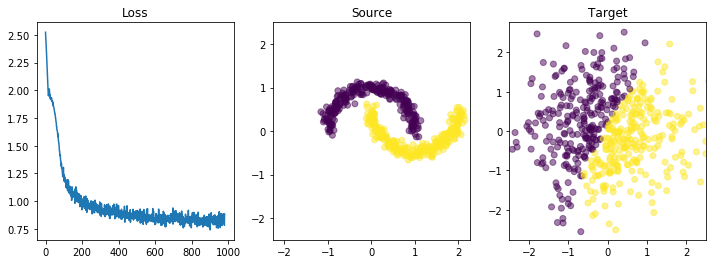

 90%|█████████ | 990/1100 [13:17<01:44,  1.05it/s]

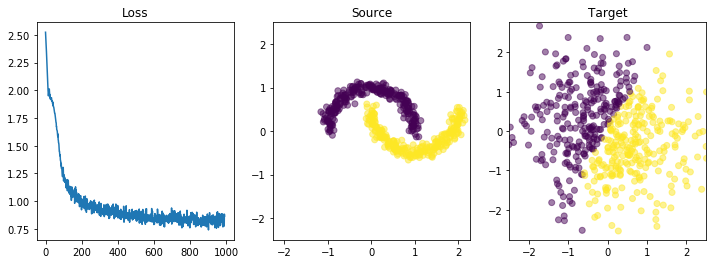

 91%|█████████ | 1000/1100 [13:27<01:36,  1.03it/s]

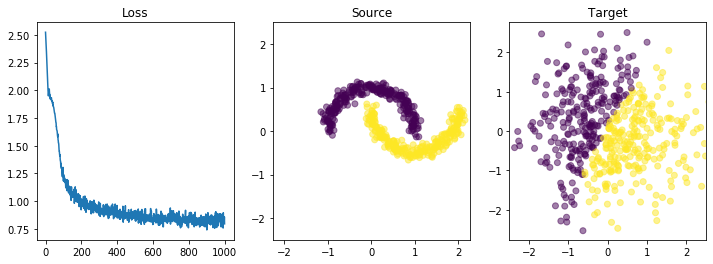

 92%|█████████▏| 1010/1100 [13:37<01:26,  1.04it/s]

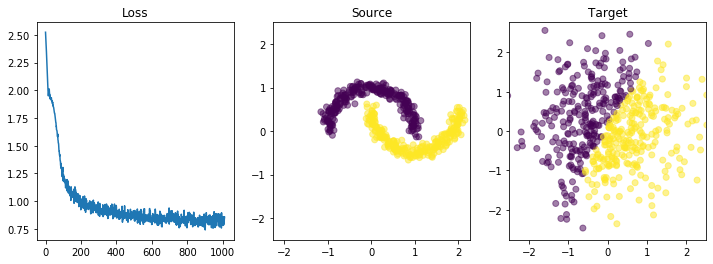

 93%|█████████▎| 1020/1100 [13:48<01:17,  1.03it/s]

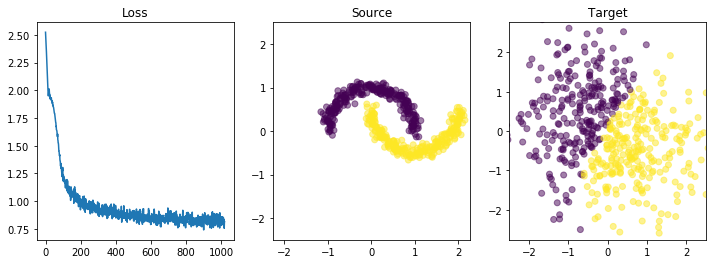

 94%|█████████▎| 1030/1100 [13:58<01:04,  1.08it/s]

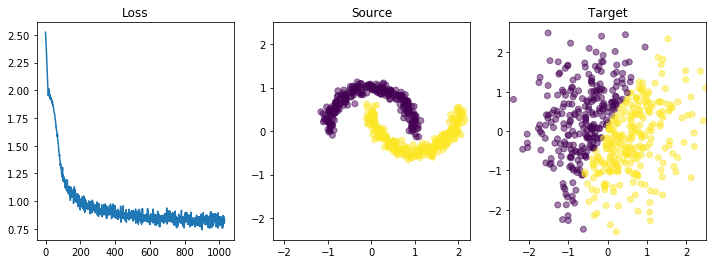

 95%|█████████▍| 1040/1100 [14:09<00:56,  1.06it/s]

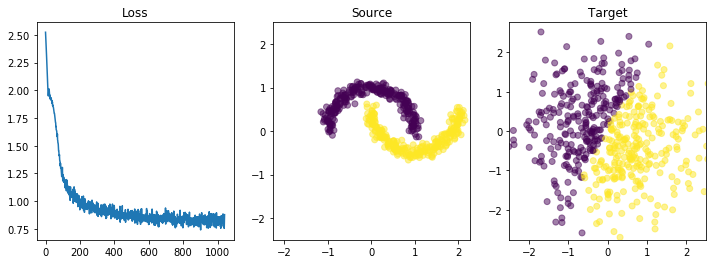

 95%|█████████▌| 1050/1100 [14:19<00:48,  1.04it/s]

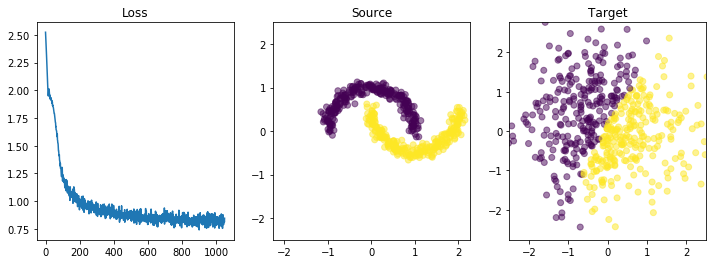

 96%|█████████▋| 1060/1100 [14:29<00:38,  1.03it/s]

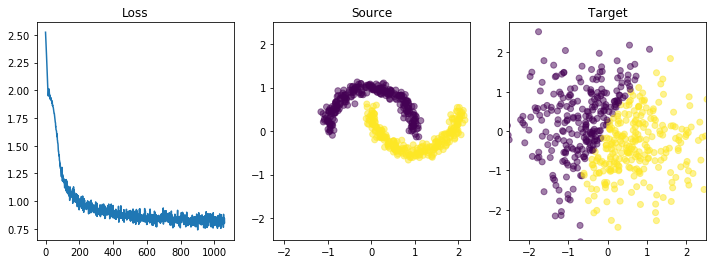

 97%|█████████▋| 1070/1100 [14:40<00:28,  1.04it/s]

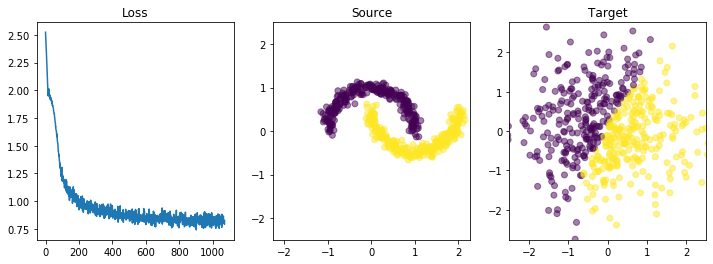

 98%|█████████▊| 1080/1100 [14:50<00:20,  1.00s/it]

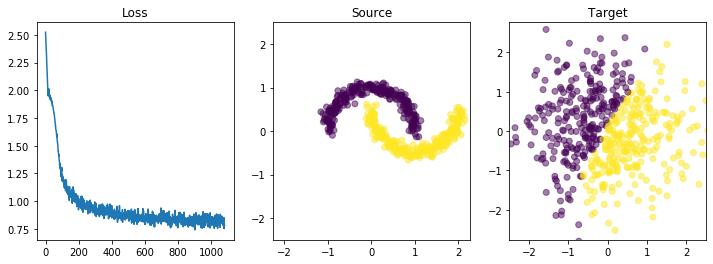

 99%|█████████▉| 1090/1100 [15:01<00:09,  1.01it/s]

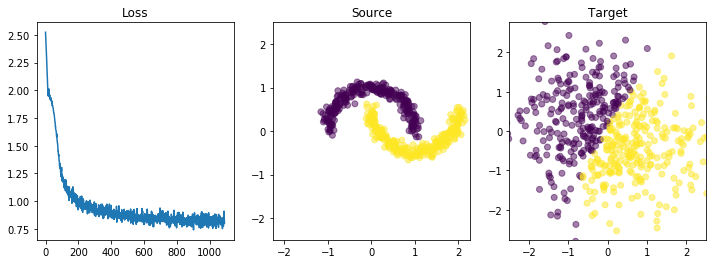

100%|██████████| 1100/1100 [15:11<00:00,  1.21it/s]


In [14]:
loss_history = []
for step in tqdm(range(1100)):
    # ^ should actuall train for 10k iters for paper
    optimizer.zero_grad()
    
    x, logp_diff_t1 = get_batch(num_samples)
    
    loss = calc_loss(x, logp_diff_t1)
    loss_history.append(loss.item())
    
    loss.backward()
    optimizer.step()
    
    if step % 10 == 0:
        z_t, logp_diff_t = odeint(
            odefunc,
            (x_test, logp_diff_t1_test),
            torch.tensor([t1, t0]).type(torch.float32).to(device),
            atol=1e-5,
            rtol=1e-5,
            method='dopri5',
        )

        z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]
        
        plt.figure(figsize=(12, 4))
        
        plt.subplot(131)
        plt.title("Loss")
        plt.plot(loss_history)
        
        plt.subplot(132)
        plt.title("Source")
        plt.scatter(*x_test.detach().cpu().numpy().T, c=classes, alpha=0.5)   
        plt.axis("equal")
        plt.xlim([-2.5, 2.5])
        plt.ylim([-2.5, 2.5])
        
        plt.subplot(133)        
        plt.title("Target")
        plt.scatter(*z_t0.detach().cpu().numpy().T, c=classes, alpha=0.5)   
        plt.axis("equal")        
        plt.xlim([-2.5, 2.5])
        plt.ylim([-2.5, 2.5])
        
        plt.savefig(f"cnfs/training/step_{1000 + step}.jpg")
        plt.show()
        plt.clf()
        plt.cla()
        plt.close()

### Test reconstruction of points: two moons -> gaussian -> two moons

In [15]:
# forward -> backward
z_t, logp_diff_t = odeint(
    odefunc,
    (x_test, logp_diff_t1_test),
    torch.tensor([t1, t0]).type(torch.float32).to(device),
    atol=1e-5,
    rtol=1e-5,
    method='dopri5',
)
z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]

z_t, _ = odeint(
    odefunc,
    (z_t0, logp_diff_t0),
    torch.tensor([t0, t1]).type(torch.float32).to(device),
    atol=1e-5,
    rtol=1e-5,
    method='dopri5',
)

x_recon = z_t[-1]

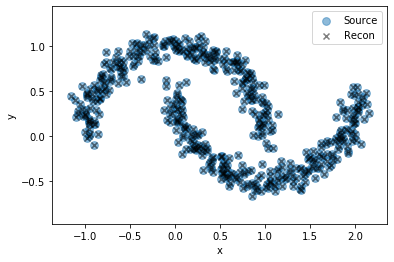

In [16]:
plt.scatter(*x_test.detach().cpu().numpy().T, alpha=0.5, label="Source", s=60)
plt.scatter(*x_recon.detach().cpu().numpy().T, color='k', alpha=0.5, marker='x', label="Recon")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
_ = plt.axis("equal")
plt.show()

### Sample points

In [17]:
z_t0 = norm.sample([num_samples]).to(device)
logp_diff_t0 = torch.zeros(num_samples, 1).type(torch.float32).to(device)

z_t, logp_diff_t = odeint(
    odefunc,
    (z_t0, logp_diff_t0),
    torch.tensor(np.linspace(t0, t1, 10)).to(device),
    atol=1e-5,
    rtol=1e-5,
    method='dopri5',
)
z_t1, logp_diff_t1 = z_t[-1], logp_diff_t[-1]

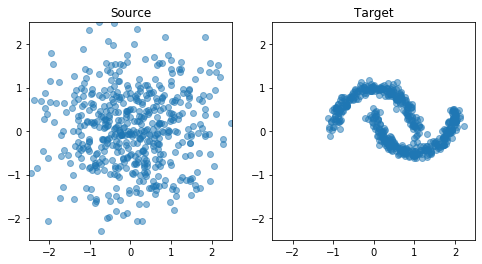

In [18]:
plt.figure(figsize=(8, 4))

plt.subplot(121)
plt.title("Source")
plt.scatter(*z_t0.detach().cpu().numpy().T, alpha=0.5)
plt.xlim([-2.5, 2.5])
plt.ylim([-2.5, 2.5])

plt.subplot(122)
plt.title("Target")
plt.scatter(*z_t1.detach().cpu().numpy().T, alpha=0.5)
plt.xlim([-2.5, 2.5])
plt.ylim([-2.5, 2.5])

plt.show()

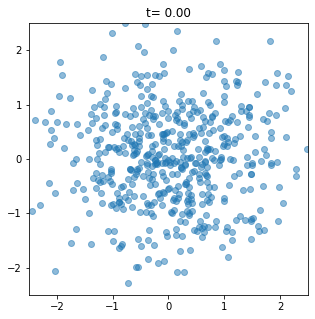

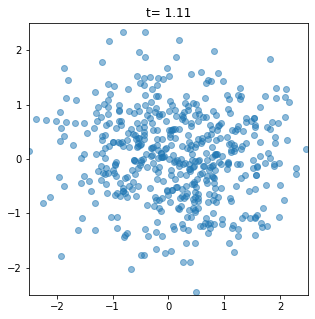

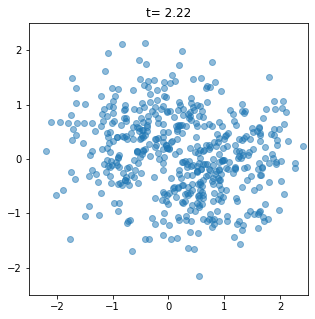

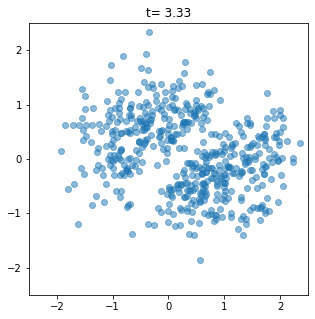

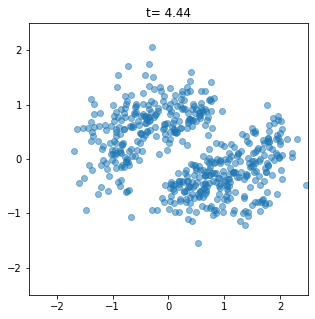

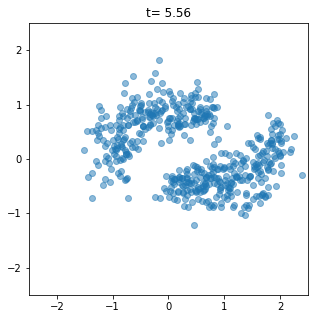

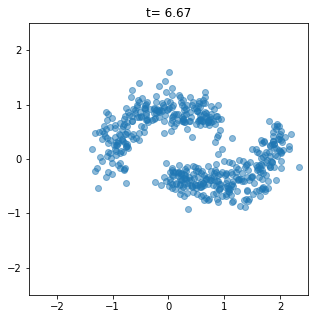

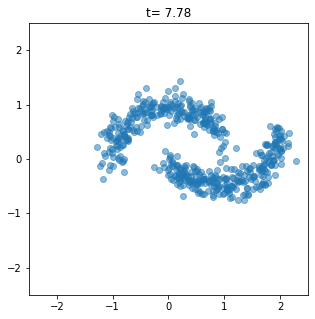

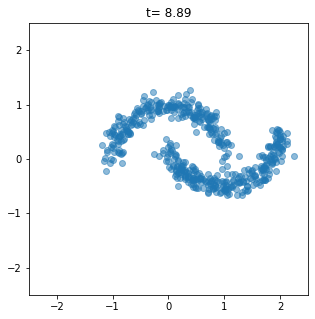

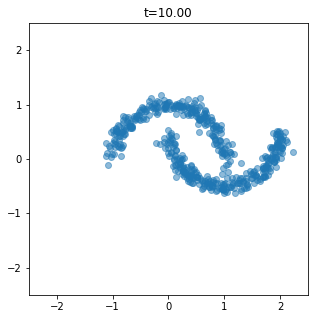

In [19]:
for step, (t, z) in enumerate(zip(np.linspace(t0, t1, 10), z_t.detach().cpu().numpy())):
    plt.figure(figsize=(5, 5))    
    plt.title(f"t={t:5.2f}")
    plt.scatter(*z.T, alpha=0.5)
    plt.xlim([-2.5, 2.5])
    plt.ylim([-2.5, 2.5])
    plt.show()
    plt.savefig(f"cnfs/interpolation/step_{1000 + step}.jpg")
    plt.close()

### Transformed probablity density function

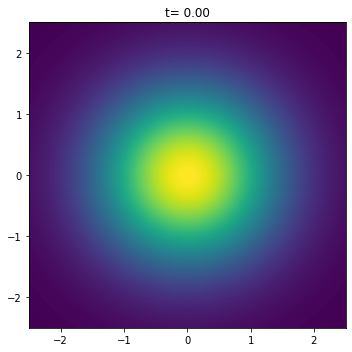

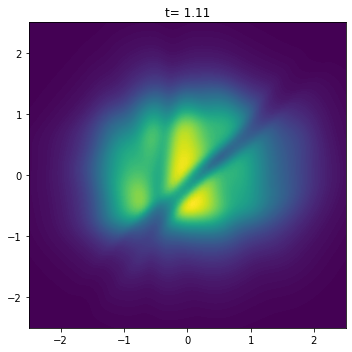

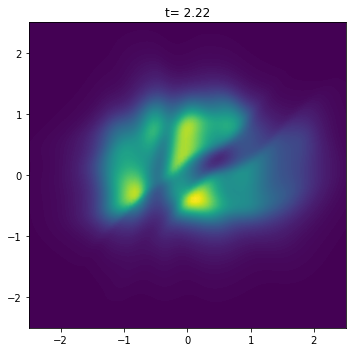

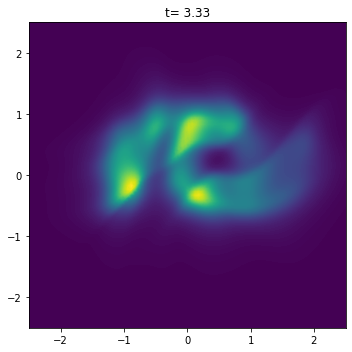

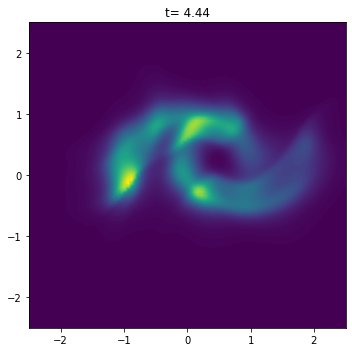

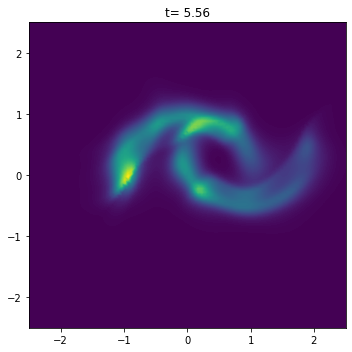

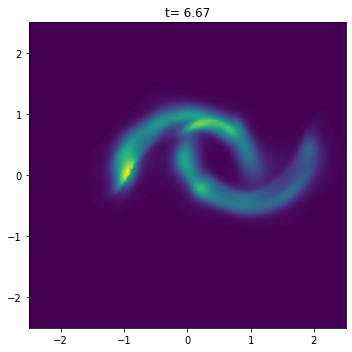

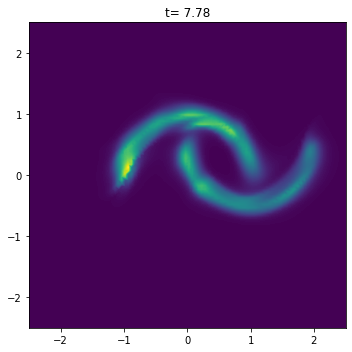

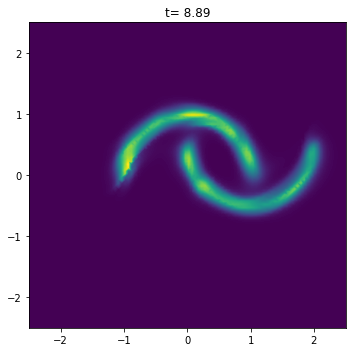

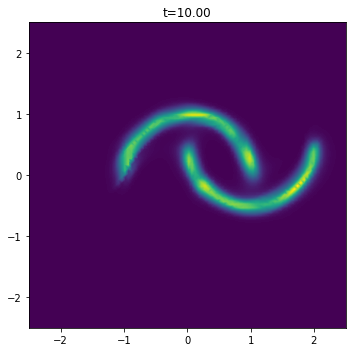

In [21]:
# Create grid of points
x = np.linspace(-2.5, 2.5, 100)
y = np.linspace(-2.5, 2.5, 100)
points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T

z_t1 = torch.tensor(points).type(torch.float32).to(device)
logp_diff_t1 = torch.zeros(z_t1.shape[0], 1).type(torch.float32).to(device)

z_t, logp_diff_t = odeint(
    odefunc,
    (z_t1, logp_diff_t1),
    torch.tensor(np.linspace(t1, t0, 10)).to(device),
    atol=1e-5,
    rtol=1e-5,
    method='dopri5',
)

for step, (t, z, logp_diff) in enumerate(zip(np.linspace(t0, t1, 10), z_t, logp_diff_t)):

    
    logp = norm.log_prob(z) - logp_diff.view(-1)

    plt.figure(figsize=(5, 5))
    plt.title(f"t={t:5.2f}")
    plt.tricontourf(*z_t1.detach().cpu().numpy().T, np.exp(logp.detach().cpu().numpy()), 200)
    plt.tight_layout()
    plt.show()
    plt.savefig(f"cnfs/density/step_{1000 + step}.jpg")
    plt.close()

## Recreate Fig 4. from the paper

### Define data

In [8]:
num_samples = 512

In [6]:
norm = torch.distributions.MultivariateNormal(loc=torch.tensor([0.0, 0.0]).to(device), 
                                              covariance_matrix=torch.tensor([[1.0, 0.0], [0.0, 1.0]]).to(device))

In [9]:
x_test = norm.sample([num_samples]).to(device)
logp_diff_t1_test = torch.zeros(num_samples, 1).type(torch.float32).to(device)

In [10]:
from src.energy_functions import energy_function_1, energy_function_2, energy_function_3, energy_function_4

In [11]:
x = np.linspace(-4, 4, 100)
y = np.linspace(-4, 4, 100)
points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T

In [12]:
points.shape

(10000, 2)

(-4, 4)

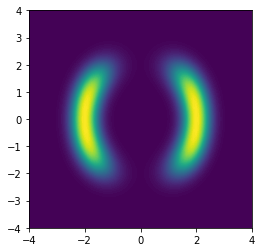

In [14]:
probs = energy_function_1(torch.tensor(points).type(torch.float32)).numpy()
plt.figure(figsize=(4, 4))
plt.tricontourf(points[:, 0], points[:, 1], np.exp(-probs)[:,0], 100)
plt.xlim([-4, 4])
plt.ylim([-4, 4])

In [15]:
t0 = 0
t1 = 10

In [16]:
energy_fun = energy_function_1

### Define model

In [53]:
odefunc = CNF(in_out_dim=2, hidden_dim=16, width=2)
# ^ have to guess hidden_dim

if device != "cpu":
    odefunc = odefunc.cuda()

In [54]:
optimizer = optim.Adam(odefunc.parameters(), lr=1e-3, weight_decay=0.)
# have to guess the LR (should check FFJORD paper)

In [55]:
# TODO: convert to KLD???
def calc_loss(x, logp_diff_t1):
    z_t, logp_diff_t = odeint(
            odefunc,
            (x, logp_diff_t1),
            torch.tensor([t1, t0]).type(torch.float32).to(device),
            atol=1e-5,
            rtol=1e-5,
            method='dopri5',
        )

    z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]
    
    logp_x =  -energy_fun(z_t0).view(-1) - logp_diff_t0.view(-1)
    
    loss = -logp_x.mean(0)

    return loss

### Train


  0%|          | 0/1100 [00:00<?, ?it/s]

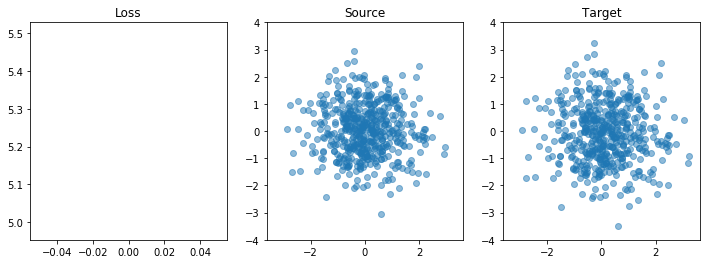


  1%|          | 10/1100 [00:03<05:26,  3.34it/s]

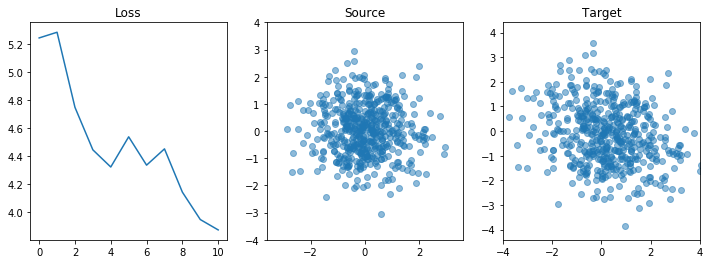


  2%|▏         | 20/1100 [00:06<05:39,  3.18it/s]

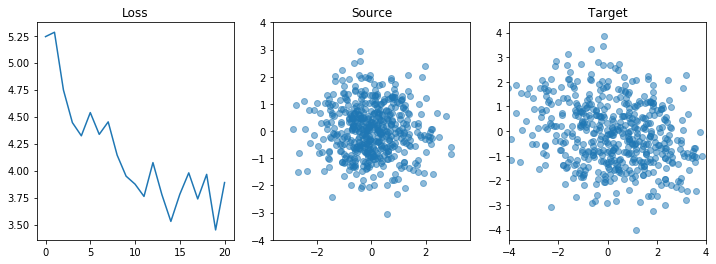


  3%|▎         | 30/1100 [00:10<05:42,  3.12it/s]

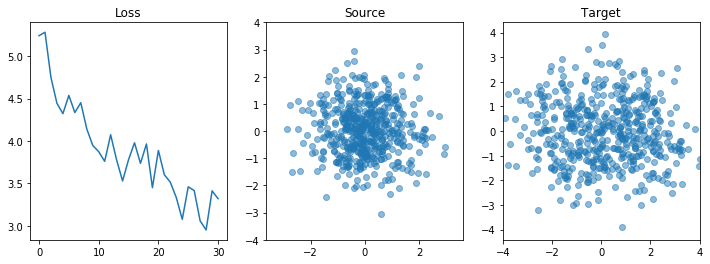


  4%|▎         | 40/1100 [00:14<06:40,  2.65it/s]

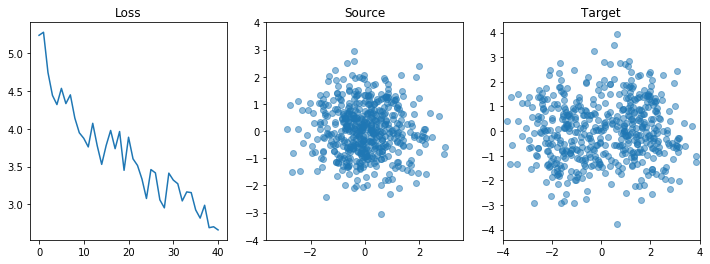


  5%|▍         | 50/1100 [00:19<07:30,  2.33it/s]

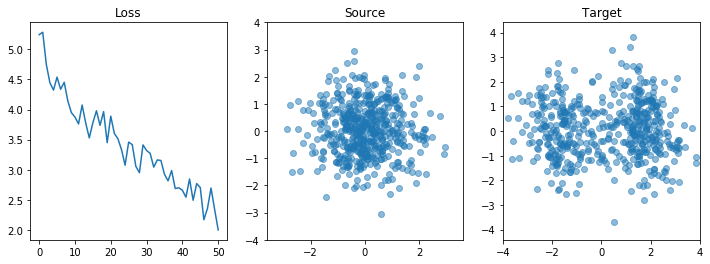


  5%|▌         | 60/1100 [00:24<08:12,  2.11it/s]

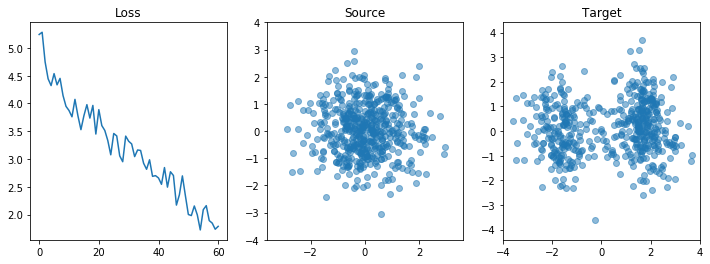


  6%|▋         | 70/1100 [00:29<08:44,  1.96it/s]

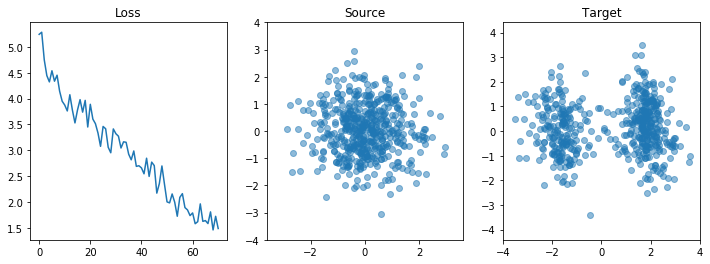


  7%|▋         | 80/1100 [00:35<08:36,  1.97it/s]

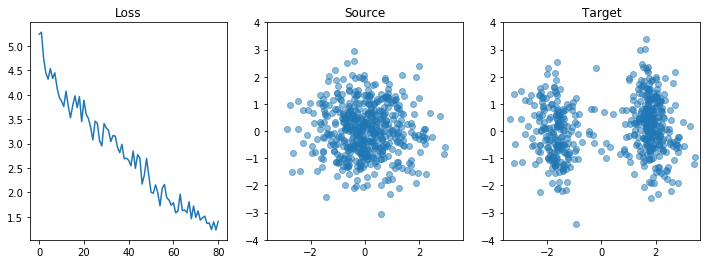


  8%|▊         | 90/1100 [00:41<09:05,  1.85it/s]

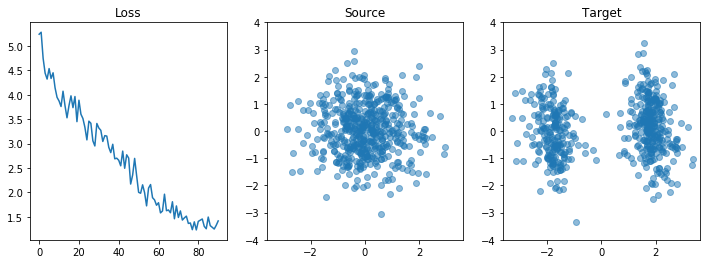


  9%|▉         | 100/1100 [00:46<09:01,  1.85it/s]

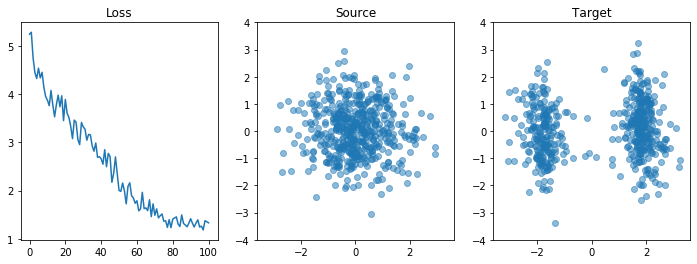


 10%|█         | 110/1100 [00:52<08:47,  1.88it/s]

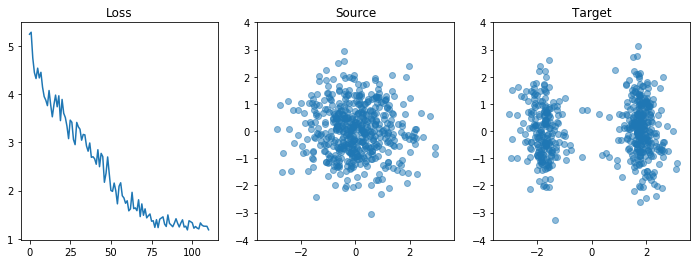


 11%|█         | 120/1100 [00:58<08:59,  1.82it/s]

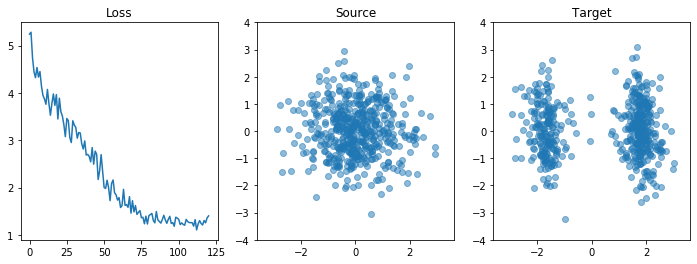


 12%|█▏        | 130/1100 [01:04<09:07,  1.77it/s]

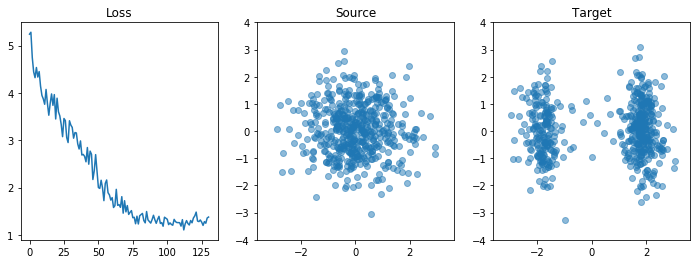


 13%|█▎        | 140/1100 [01:10<08:44,  1.83it/s]

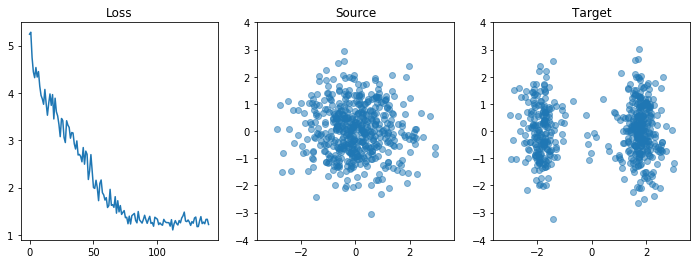


 14%|█▎        | 150/1100 [01:16<08:50,  1.79it/s]

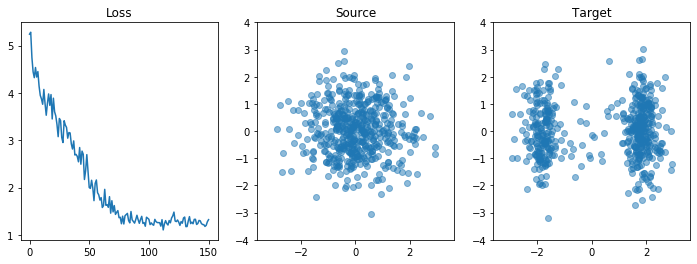


 15%|█▍        | 160/1100 [01:22<08:19,  1.88it/s]

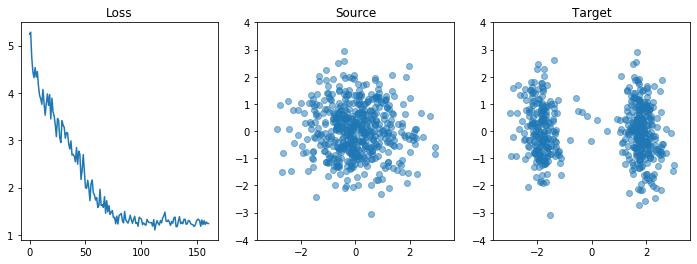


 15%|█▌        | 170/1100 [01:28<08:27,  1.83it/s]

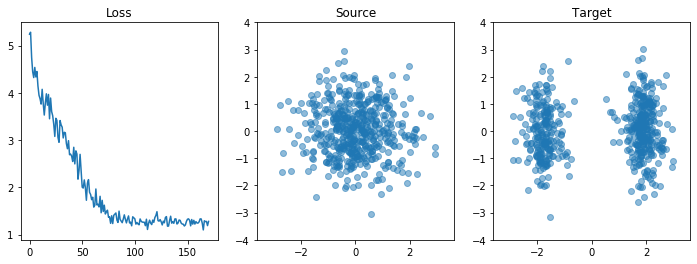


 16%|█▋        | 180/1100 [01:34<08:30,  1.80it/s]

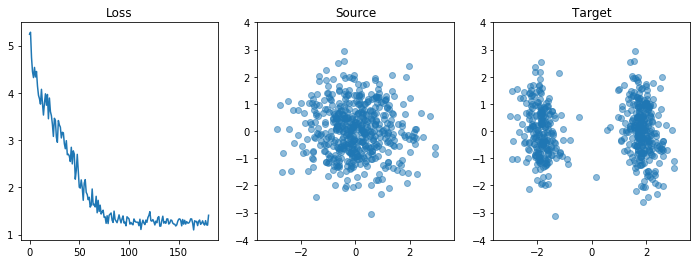


 17%|█▋        | 190/1100 [01:40<08:26,  1.80it/s]

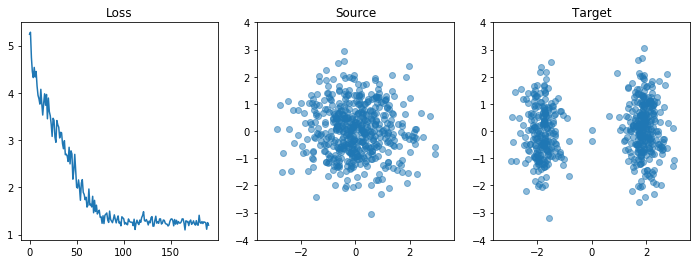


 18%|█▊        | 200/1100 [01:46<08:11,  1.83it/s]

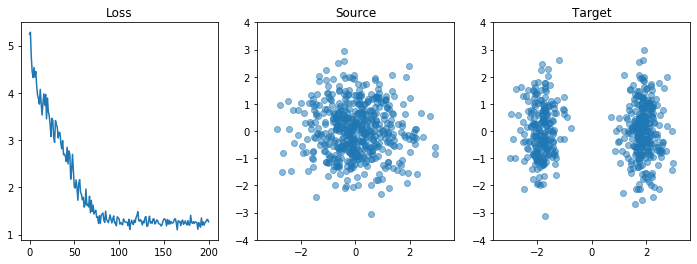


 19%|█▉        | 210/1100 [01:52<07:57,  1.86it/s]

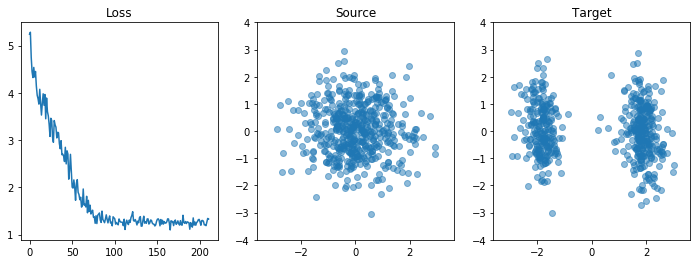


 20%|██        | 220/1100 [01:58<07:58,  1.84it/s]

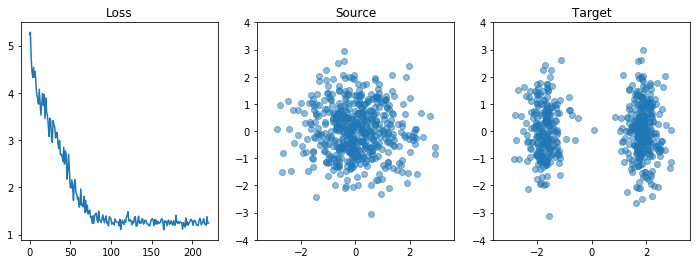


 21%|██        | 230/1100 [02:04<07:43,  1.88it/s]

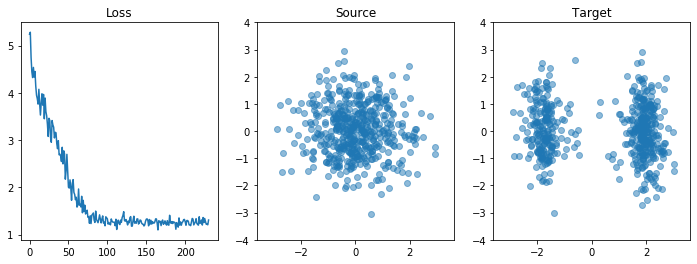


 22%|██▏       | 240/1100 [02:10<07:50,  1.83it/s]

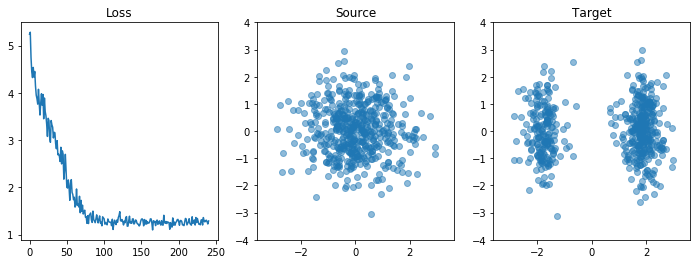


 23%|██▎       | 250/1100 [02:16<07:38,  1.85it/s]

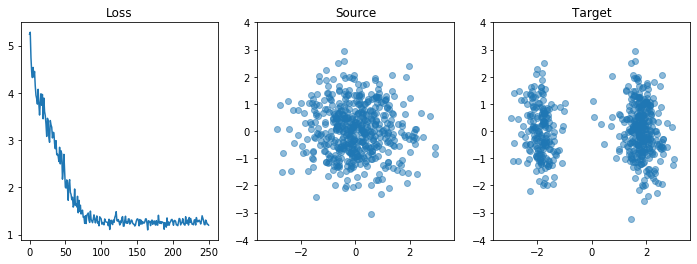


 24%|██▎       | 260/1100 [02:21<07:07,  1.97it/s]

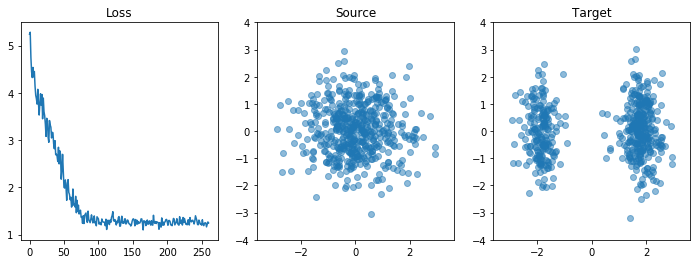


 25%|██▍       | 270/1100 [02:27<07:07,  1.94it/s]

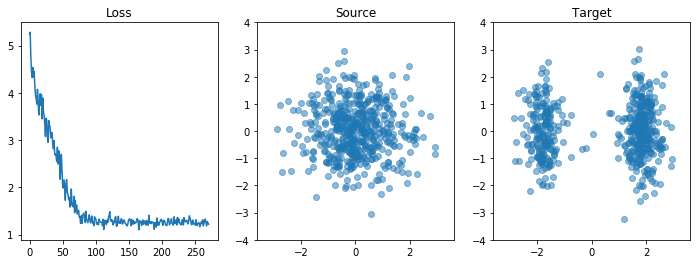


 25%|██▌       | 280/1100 [02:32<06:41,  2.04it/s]

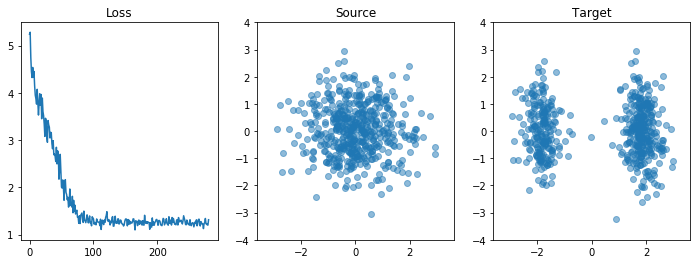


 26%|██▋       | 290/1100 [02:38<06:45,  2.00it/s]

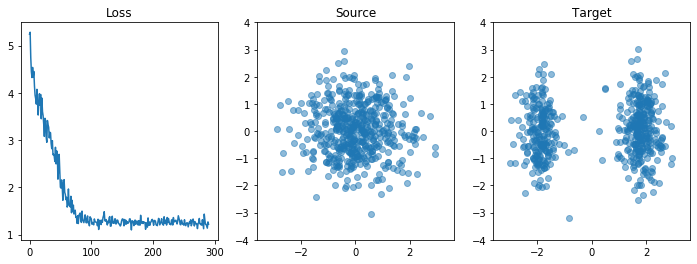


 27%|██▋       | 300/1100 [02:43<06:32,  2.04it/s]

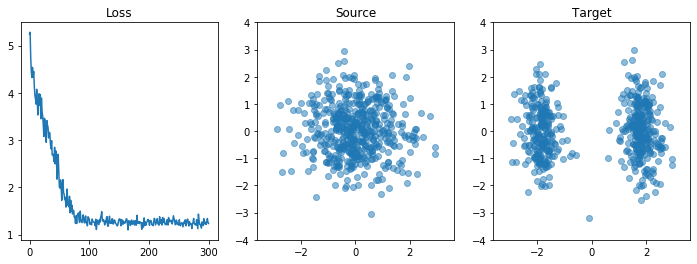


 28%|██▊       | 310/1100 [02:48<06:34,  2.00it/s]

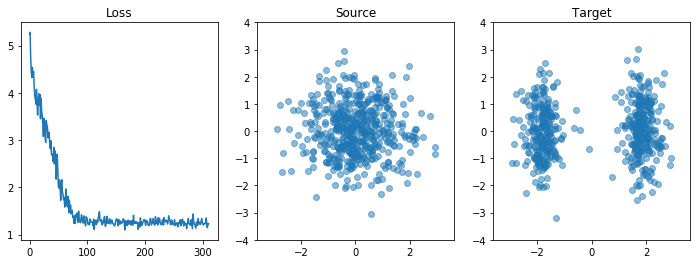


 29%|██▉       | 320/1100 [02:54<06:35,  1.97it/s]

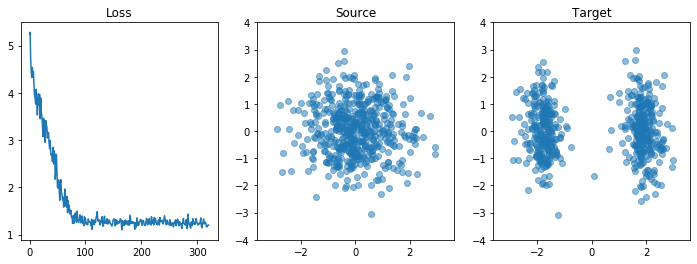


 30%|███       | 330/1100 [03:00<06:44,  1.90it/s]

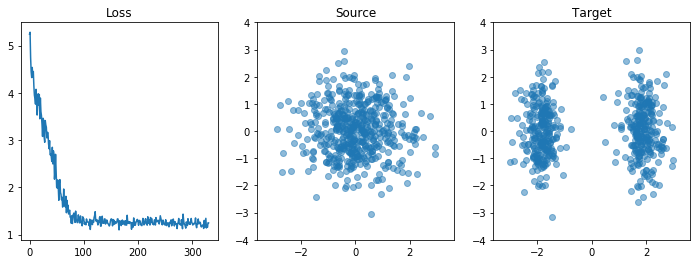


 31%|███       | 340/1100 [03:05<06:29,  1.95it/s]

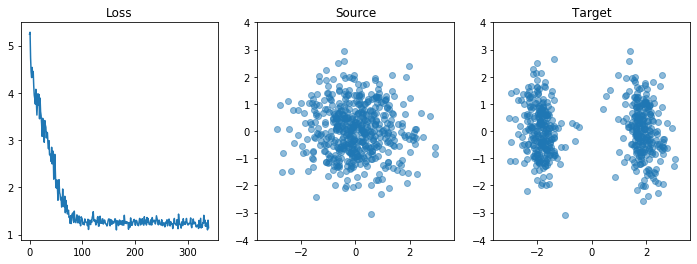


 32%|███▏      | 350/1100 [03:11<06:19,  1.97it/s]

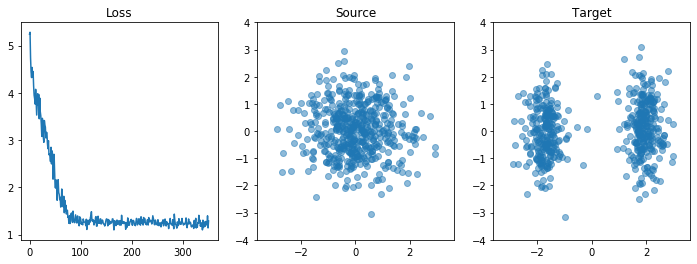


 33%|███▎      | 360/1100 [03:16<06:23,  1.93it/s]

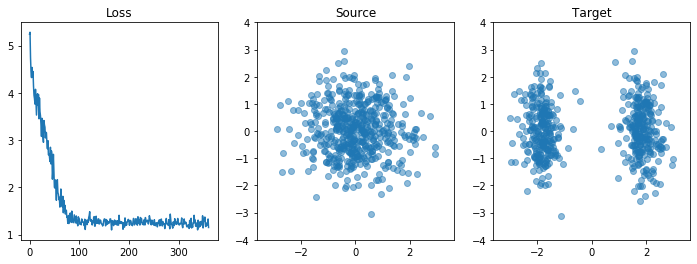


 34%|███▎      | 370/1100 [03:22<06:07,  1.99it/s]

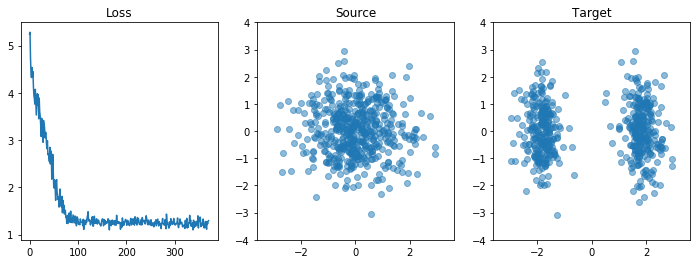


 35%|███▍      | 380/1100 [03:28<06:10,  1.94it/s]

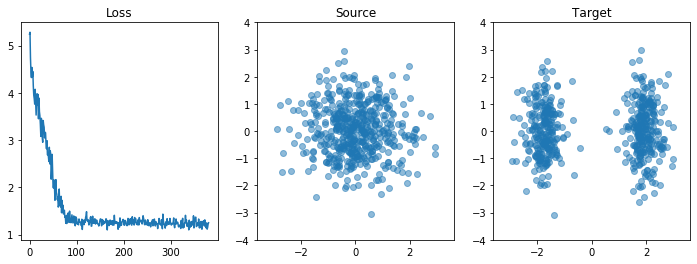


 35%|███▌      | 390/1100 [03:33<06:06,  1.94it/s]

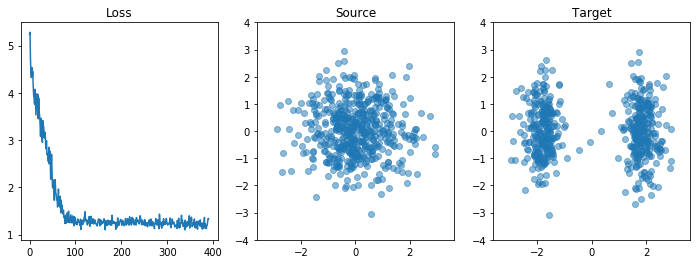


 36%|███▋      | 400/1100 [03:39<06:04,  1.92it/s]

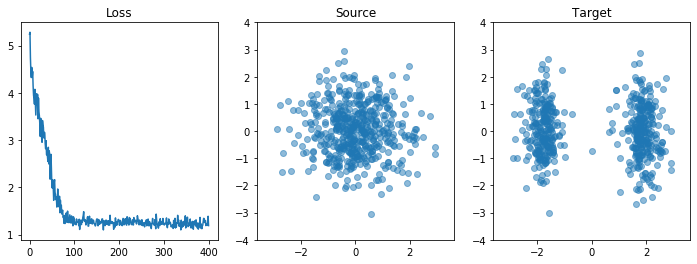


 37%|███▋      | 410/1100 [03:44<06:02,  1.90it/s]

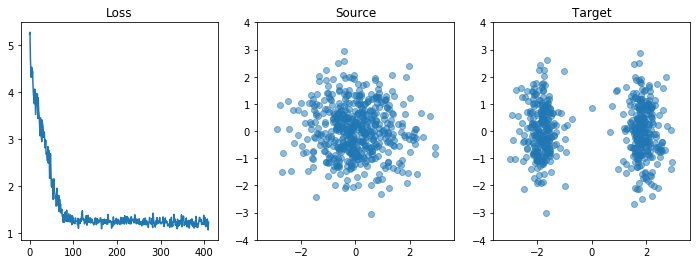


 38%|███▊      | 420/1100 [03:50<05:48,  1.95it/s]

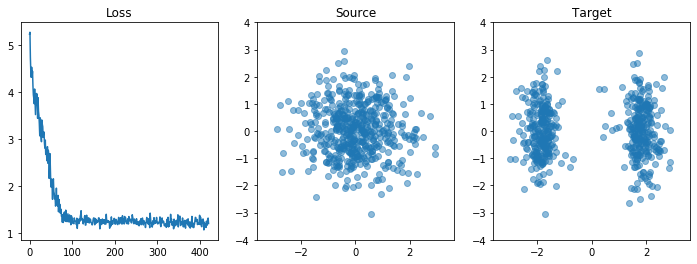


 39%|███▉      | 430/1100 [03:55<05:34,  2.00it/s]

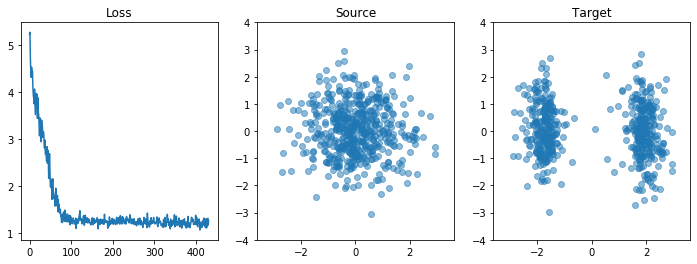


 40%|████      | 440/1100 [04:01<05:24,  2.03it/s]

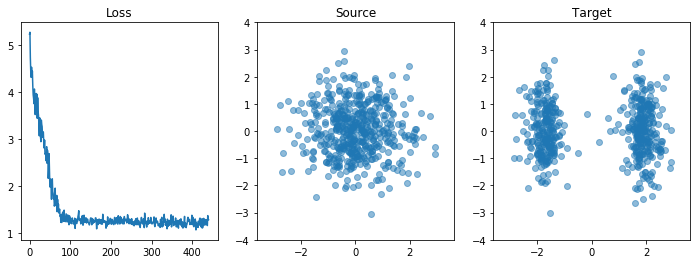


 41%|████      | 450/1100 [04:06<05:31,  1.96it/s]

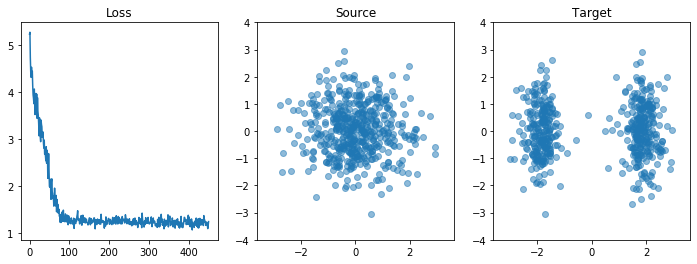


 42%|████▏     | 460/1100 [04:12<05:24,  1.97it/s]

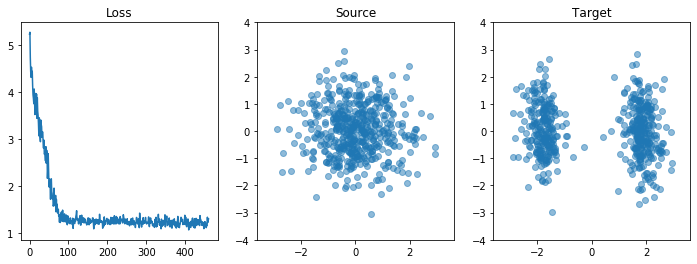


 43%|████▎     | 470/1100 [04:18<05:09,  2.04it/s]

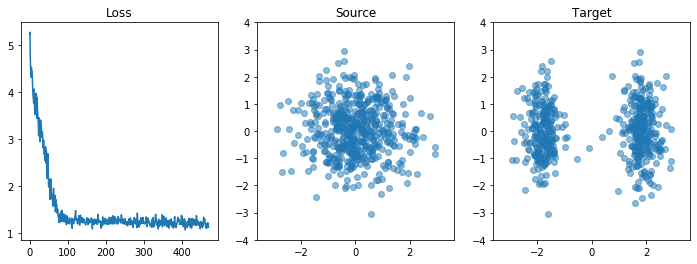


 44%|████▎     | 480/1100 [04:23<05:26,  1.90it/s]

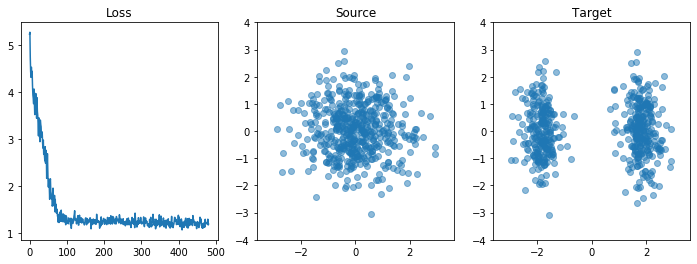


 45%|████▍     | 490/1100 [04:29<05:12,  1.95it/s]

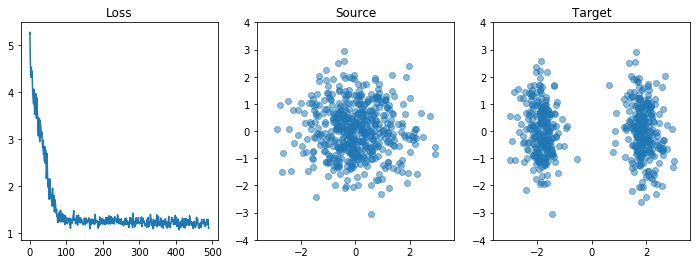


 45%|████▌     | 500/1100 [04:34<05:05,  1.97it/s]

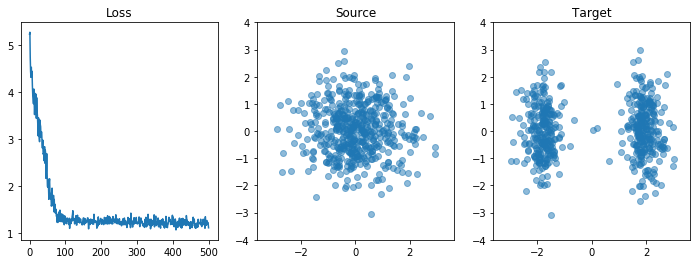


 46%|████▋     | 510/1100 [04:40<04:53,  2.01it/s]

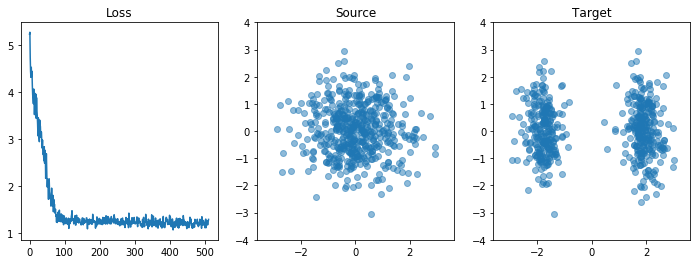


 47%|████▋     | 520/1100 [04:45<04:53,  1.98it/s]

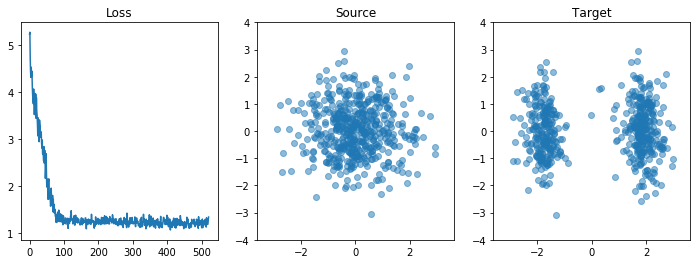


 48%|████▊     | 530/1100 [04:51<04:48,  1.97it/s]

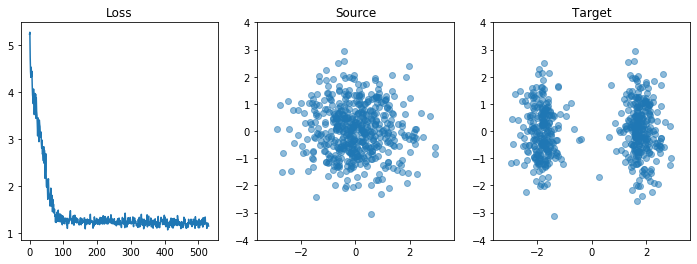


 49%|████▉     | 540/1100 [04:57<04:49,  1.93it/s]

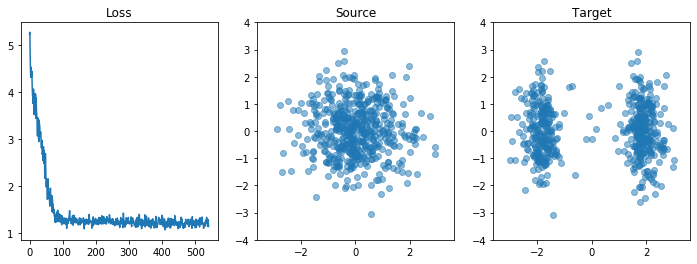


 50%|█████     | 550/1100 [05:02<04:34,  2.00it/s]

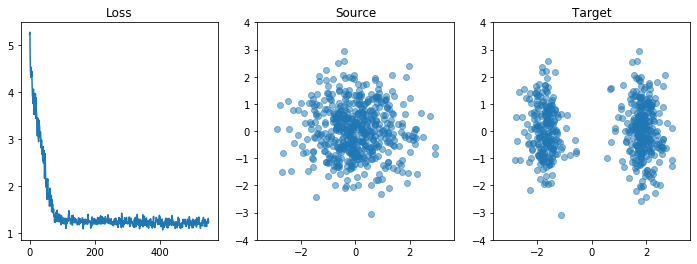


 51%|█████     | 560/1100 [05:08<04:37,  1.94it/s]

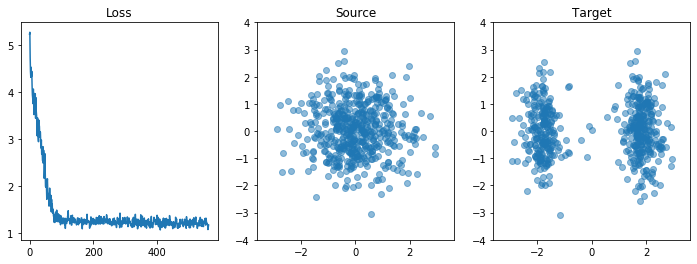


 52%|█████▏    | 570/1100 [05:13<04:31,  1.95it/s]

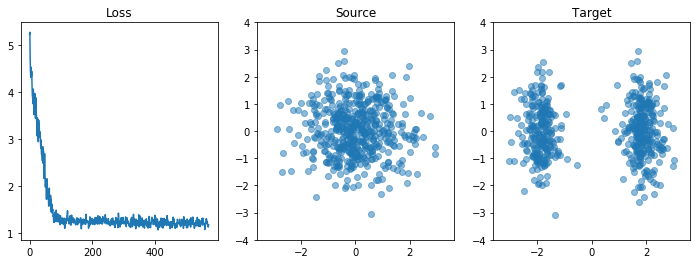


 53%|█████▎    | 580/1100 [05:19<04:23,  1.97it/s]

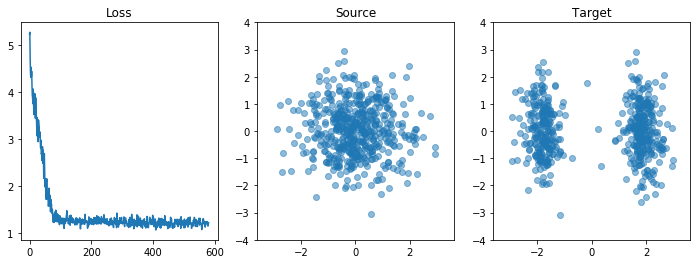


 54%|█████▎    | 590/1100 [05:25<04:22,  1.95it/s]

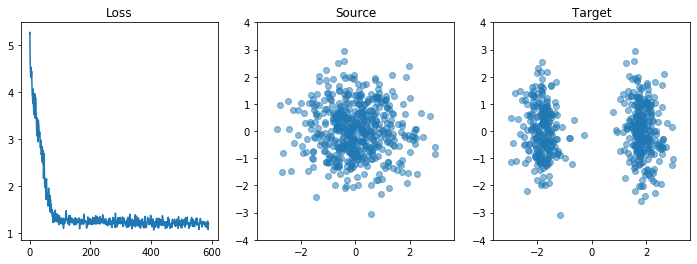


 55%|█████▍    | 600/1100 [05:30<04:17,  1.94it/s]

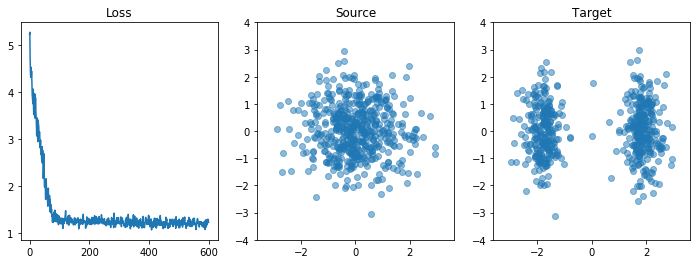


 55%|█████▌    | 610/1100 [05:36<04:11,  1.95it/s]

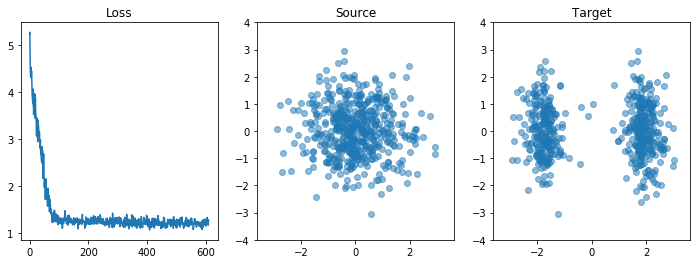


 56%|█████▋    | 620/1100 [05:42<04:15,  1.88it/s]

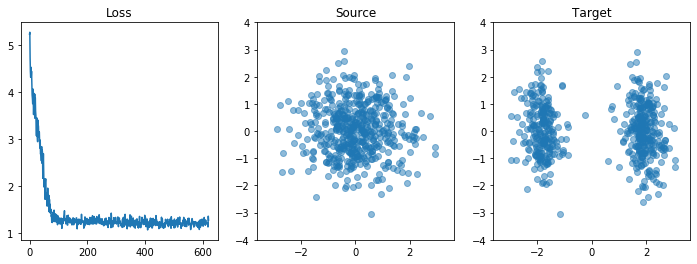


 57%|█████▋    | 630/1100 [05:48<04:11,  1.87it/s]

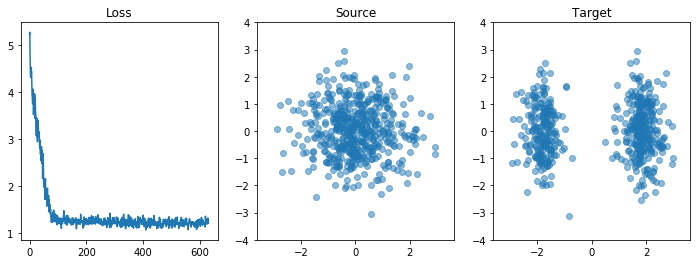


 58%|█████▊    | 640/1100 [05:53<04:02,  1.90it/s]

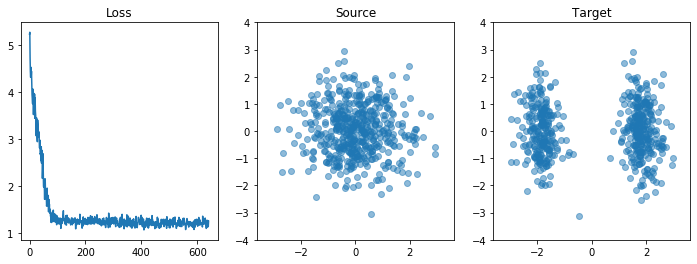


 59%|█████▉    | 650/1100 [05:59<03:54,  1.92it/s]

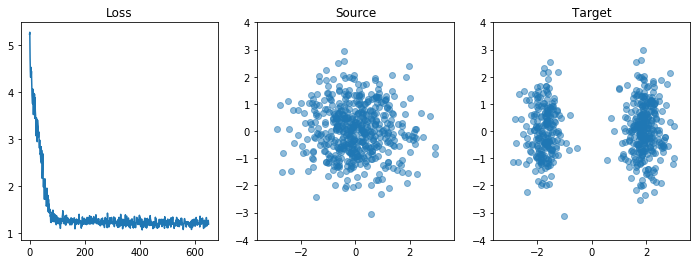


 60%|██████    | 660/1100 [06:05<03:55,  1.87it/s]

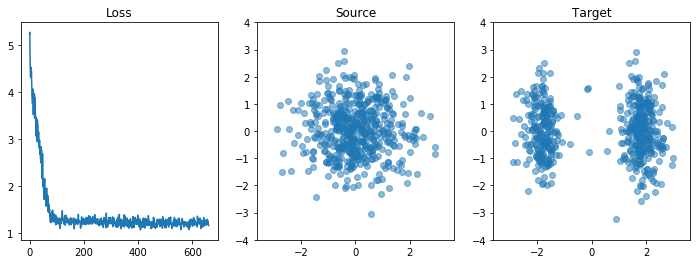


 61%|██████    | 670/1100 [06:11<03:51,  1.86it/s]

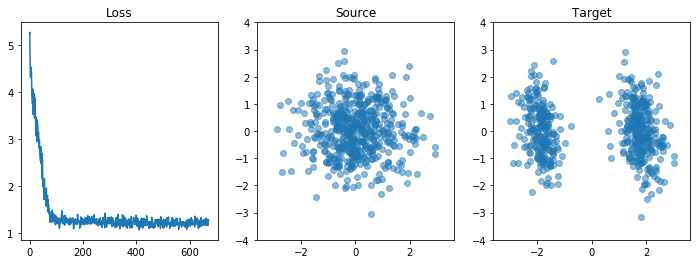


 62%|██████▏   | 680/1100 [06:16<03:40,  1.91it/s]

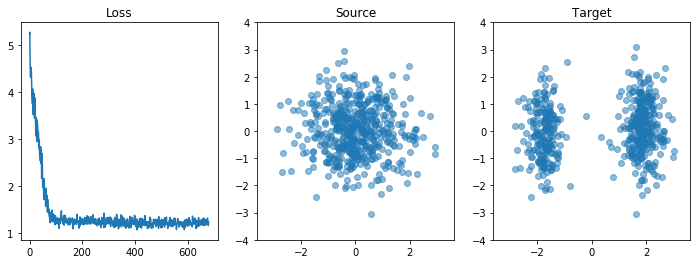


 63%|██████▎   | 690/1100 [06:22<03:31,  1.94it/s]

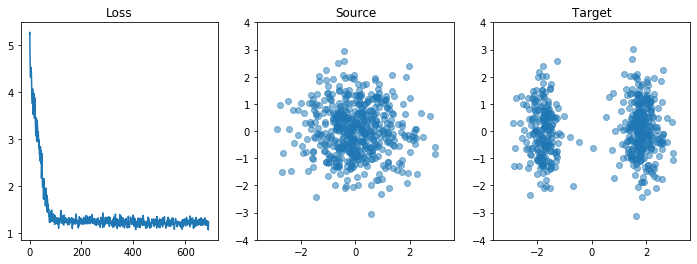


 64%|██████▎   | 700/1100 [06:28<03:27,  1.92it/s]

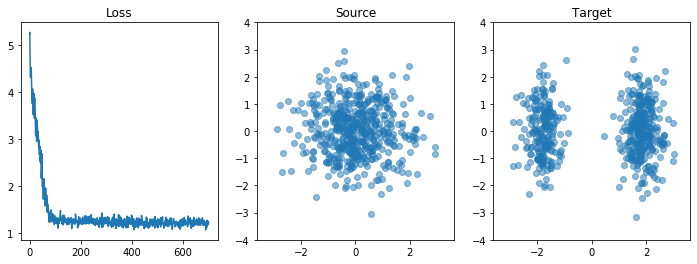


 65%|██████▍   | 710/1100 [06:33<03:24,  1.90it/s]

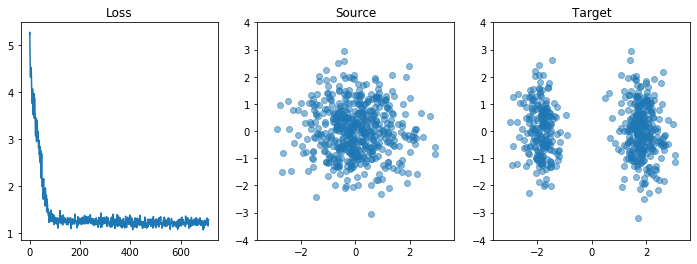


 65%|██████▌   | 720/1100 [06:39<03:20,  1.90it/s]

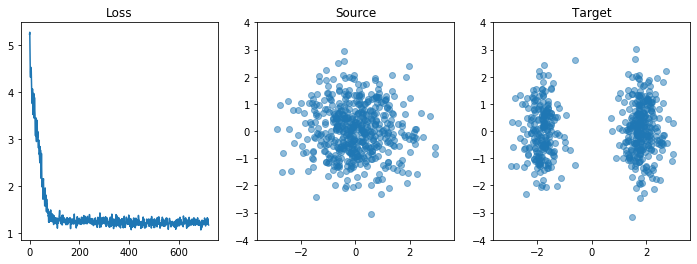


 66%|██████▋   | 730/1100 [06:45<03:10,  1.94it/s]

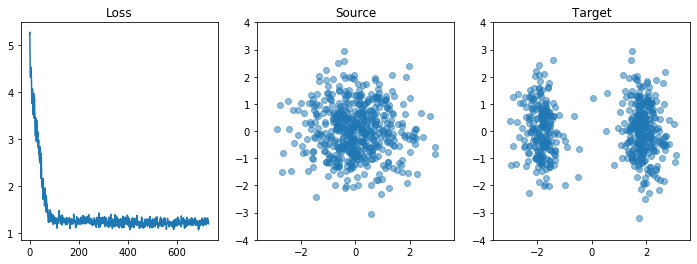


 67%|██████▋   | 740/1100 [06:51<03:12,  1.87it/s]

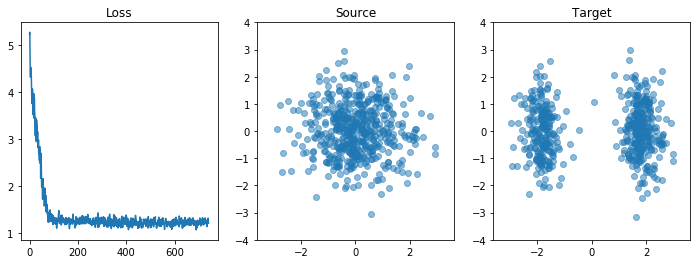


 68%|██████▊   | 750/1100 [06:56<03:03,  1.91it/s]

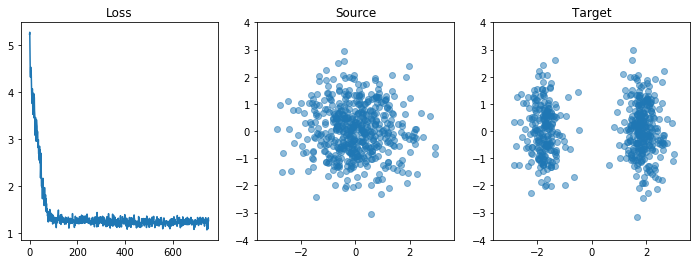


 69%|██████▉   | 760/1100 [07:02<03:03,  1.85it/s]

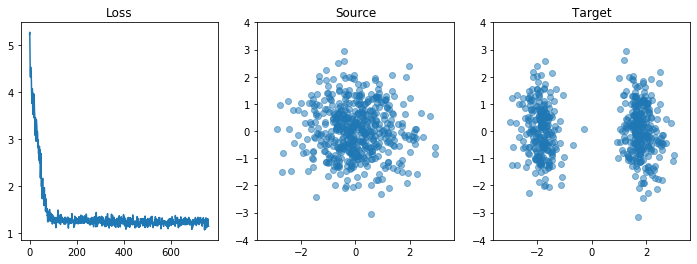


 70%|███████   | 770/1100 [07:08<02:55,  1.88it/s]

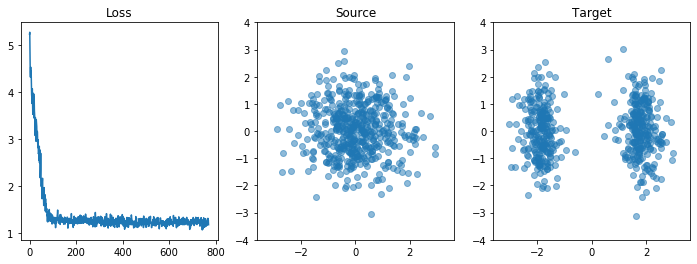


 71%|███████   | 780/1100 [07:14<02:48,  1.90it/s]

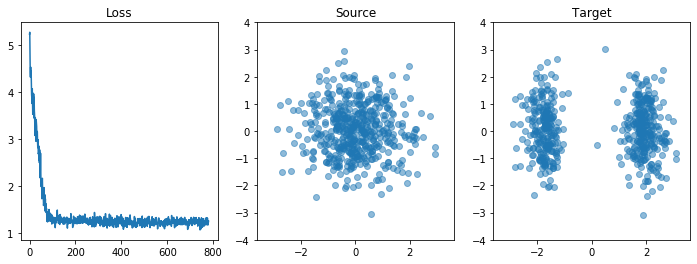


 72%|███████▏  | 790/1100 [07:19<02:39,  1.94it/s]

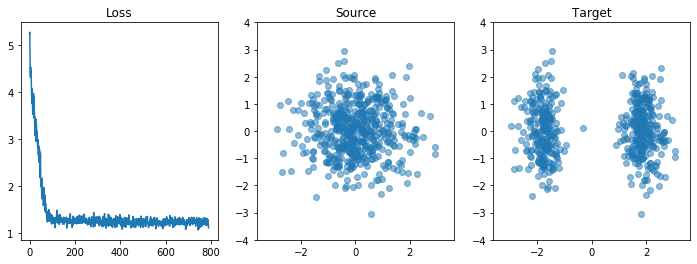


 73%|███████▎  | 800/1100 [07:25<02:33,  1.96it/s]

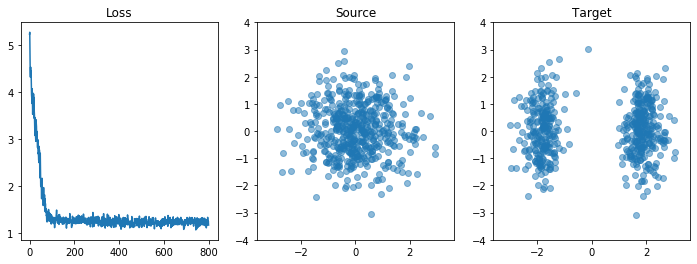


 74%|███████▎  | 810/1100 [07:31<02:29,  1.93it/s]

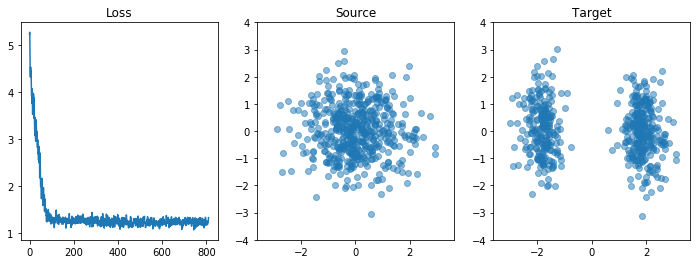


 75%|███████▍  | 820/1100 [07:37<02:30,  1.86it/s]

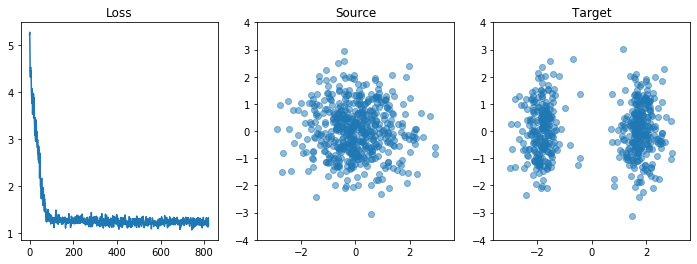


 75%|███████▌  | 830/1100 [07:42<02:16,  1.98it/s]

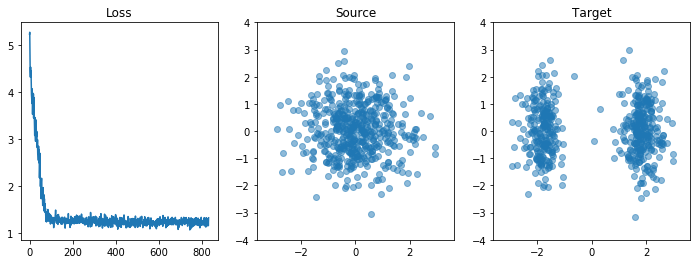


 76%|███████▋  | 840/1100 [07:48<02:19,  1.86it/s]

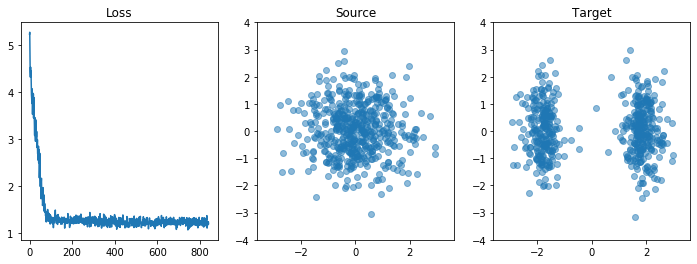


 77%|███████▋  | 850/1100 [07:54<02:13,  1.87it/s]

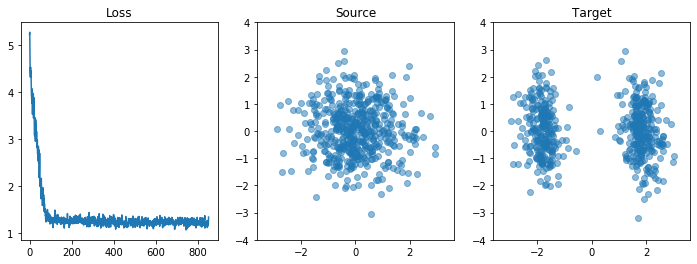


 78%|███████▊  | 860/1100 [08:00<02:10,  1.84it/s]

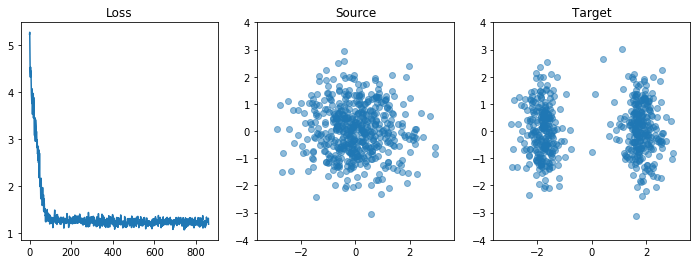


 79%|███████▉  | 870/1100 [08:06<02:02,  1.88it/s]

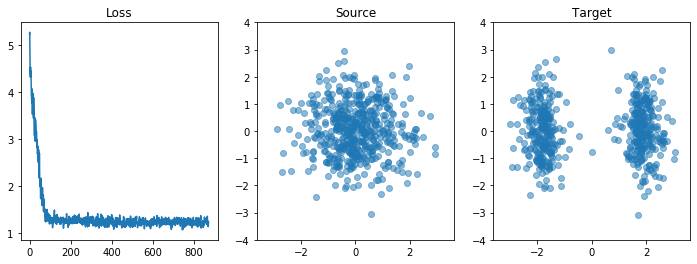


 80%|████████  | 880/1100 [08:11<01:59,  1.85it/s]

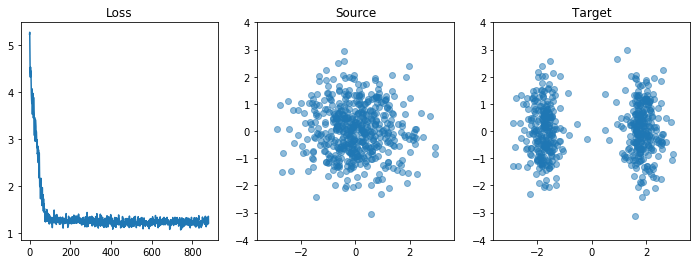


 81%|████████  | 890/1100 [08:17<01:55,  1.82it/s]

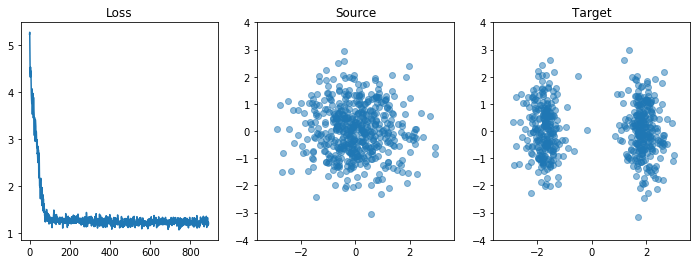


 82%|████████▏ | 900/1100 [08:23<01:45,  1.89it/s]

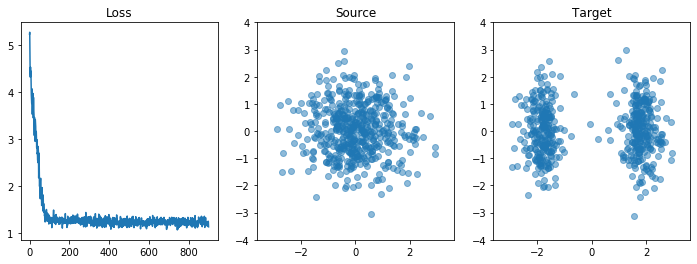


 83%|████████▎ | 910/1100 [08:29<01:40,  1.88it/s]

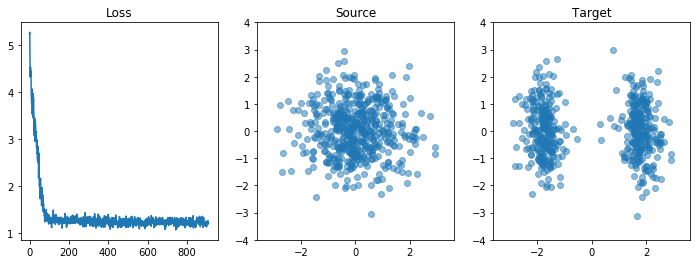


 84%|████████▎ | 920/1100 [08:35<01:36,  1.86it/s]

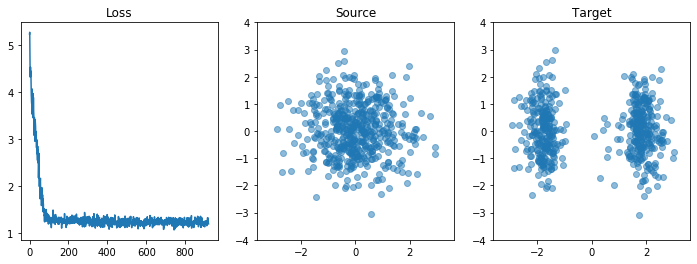


 85%|████████▍ | 930/1100 [08:40<01:29,  1.89it/s]

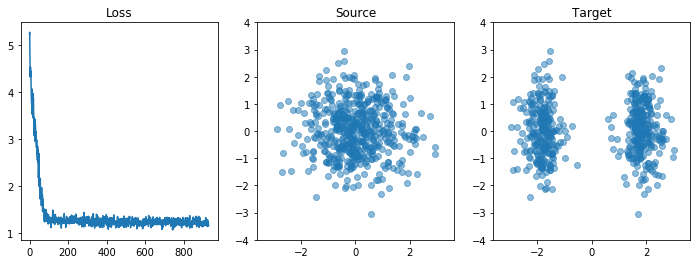


 85%|████████▌ | 940/1100 [08:46<01:29,  1.79it/s]

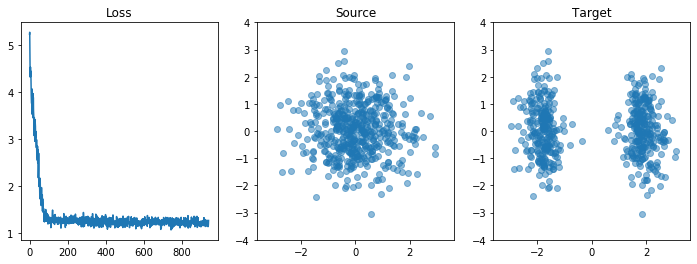


 86%|████████▋ | 950/1100 [08:53<01:24,  1.77it/s]

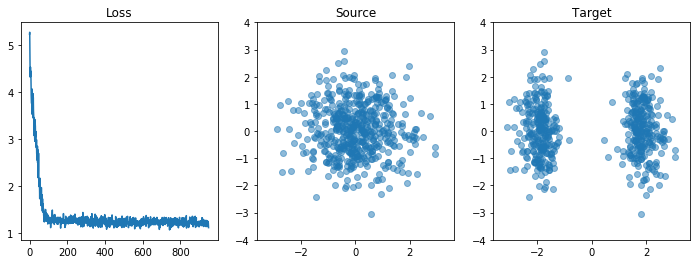


 87%|████████▋ | 960/1100 [08:59<01:18,  1.78it/s]

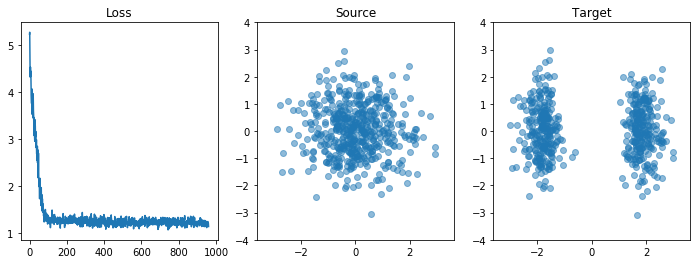


 88%|████████▊ | 970/1100 [09:05<01:15,  1.72it/s]

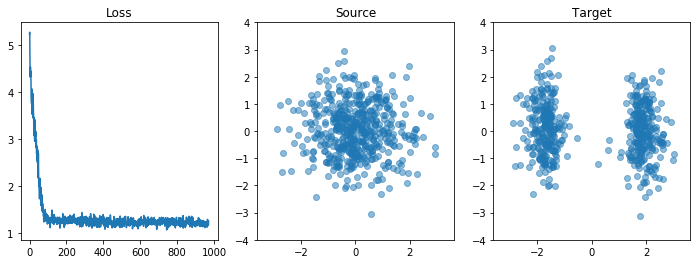


 89%|████████▉ | 980/1100 [09:11<01:08,  1.75it/s]

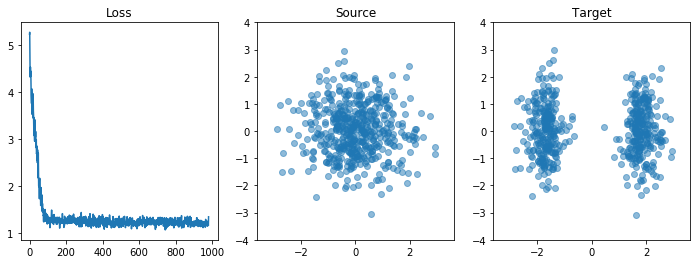


 90%|█████████ | 990/1100 [09:17<01:02,  1.77it/s]

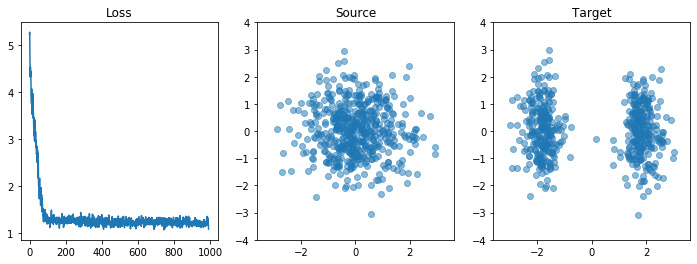


 91%|█████████ | 1000/1100 [09:24<00:57,  1.73it/s]

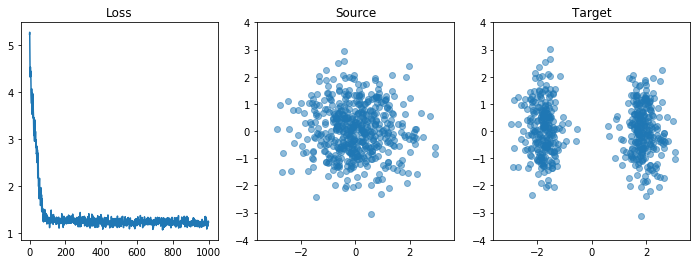


 92%|█████████▏| 1010/1100 [09:30<00:50,  1.80it/s]

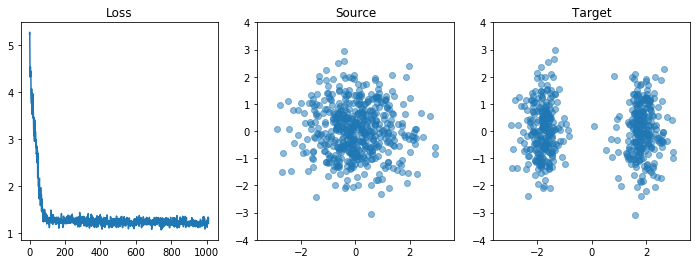


 93%|█████████▎| 1020/1100 [09:36<00:43,  1.84it/s]

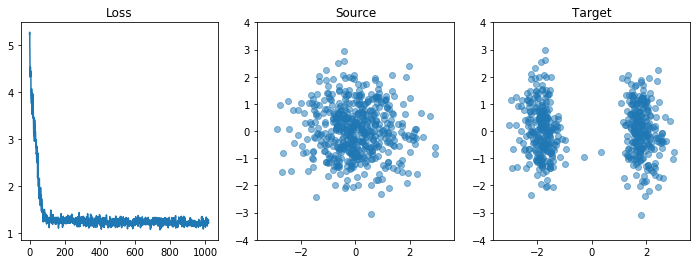


 94%|█████████▎| 1030/1100 [09:42<00:38,  1.81it/s]

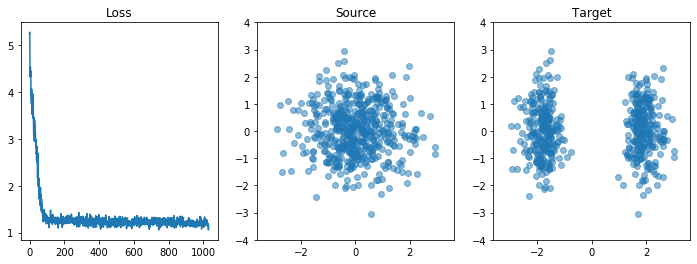


 95%|█████████▍| 1040/1100 [09:48<00:33,  1.80it/s]

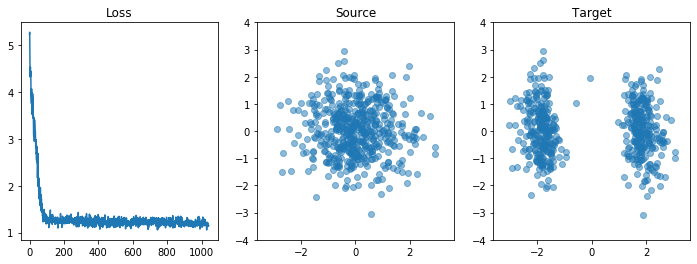


 95%|█████████▌| 1050/1100 [09:54<00:27,  1.79it/s]

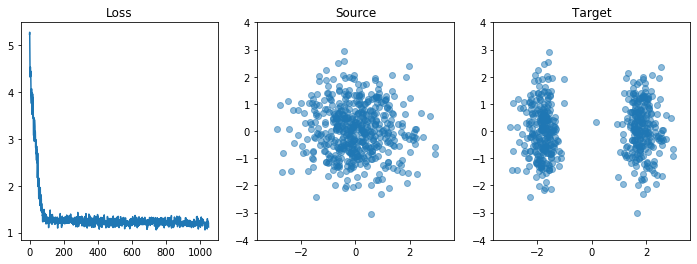


 96%|█████████▋| 1060/1100 [10:00<00:22,  1.76it/s]

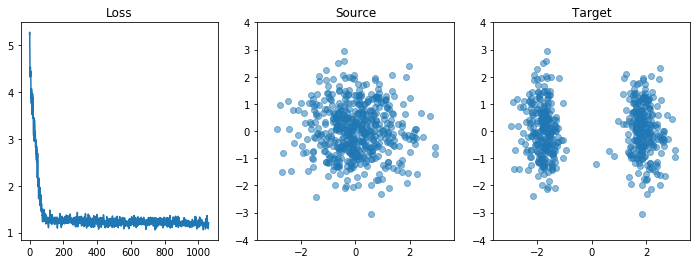


 97%|█████████▋| 1070/1100 [10:06<00:17,  1.75it/s]

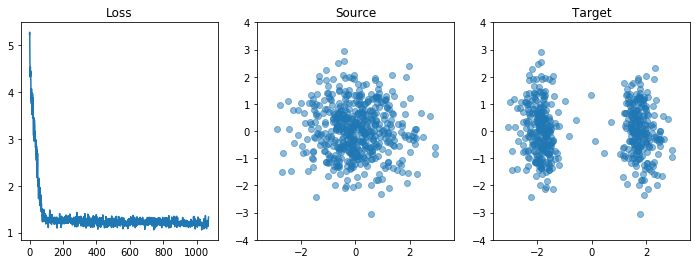


 98%|█████████▊| 1080/1100 [10:12<00:11,  1.78it/s]

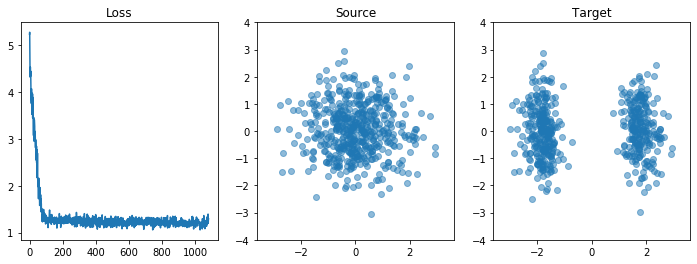


 99%|█████████▉| 1090/1100 [10:19<00:05,  1.72it/s]

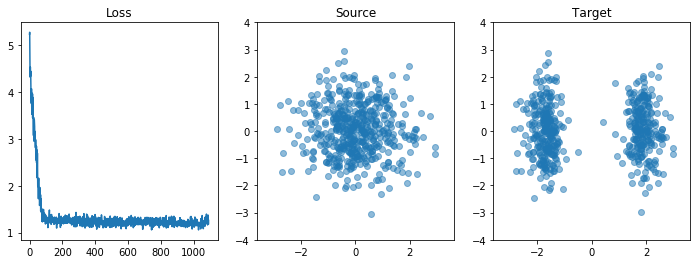


100%|██████████| 1100/1100 [10:25<00:00,  1.76it/s]


In [56]:
loss_history = []
for step in tqdm(range(1100)):
    # ^ should actuall train for 10k iters for paper
    optimizer.zero_grad()
    
    x = norm.sample([num_samples]).to(device)
    logp_diff_t1 = torch.zeros(num_samples, 1).type(torch.float32).to(device)
    
    loss = calc_loss(x, logp_diff_t1)
    loss_history.append(loss.item())
    
    loss.backward()
    optimizer.step()
    
    if step % 10 == 0:
        z_t, logp_diff_t = odeint(
            odefunc,
            (x_test, logp_diff_t1_test),
            torch.tensor([t1, t0]).type(torch.float32).to(device),
            atol=1e-5,
            rtol=1e-5,
            method='dopri5',
        )

        z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]
        
        plt.figure(figsize=(12, 4))
        
        plt.subplot(131)
        plt.title("Loss")
        plt.plot(loss_history)
        
        plt.subplot(132)
        plt.title("Source")
        plt.scatter(*x_test.detach().cpu().numpy().T, alpha=0.5)   
        plt.axis("equal")
        plt.xlim([-4, 4])
        plt.ylim([-4, 4])
        
        plt.subplot(133)        
        plt.title("Target")
        plt.scatter(*z_t0.detach().cpu().numpy().T, alpha=0.5)   
        plt.axis("equal")        
        plt.xlim([-4, 4])
        plt.ylim([-4, 4])
        
        plt.savefig(f"cnfs/training/step_{1000 + step}.jpg")
        plt.show()
        plt.clf()
        plt.cla()
        plt.close()

### Final PDF

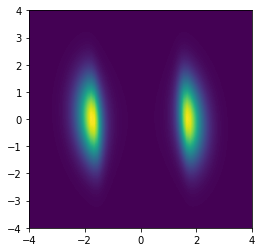

In [57]:
x = np.linspace(-4, 4, 80)
y = np.linspace(-4, 4, 80)
points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T

z_t1 = torch.tensor(points).type(torch.float32).to(device)
logp_diff_t1 = torch.zeros(z_t1.shape[0], 1).type(torch.float32).to(device)

z_t, logp_diff_t = odeint(
    odefunc,
    (z_t1, logp_diff_t1),
    torch.tensor(np.linspace(t0, t1, 10)).to(device),
    atol=1e-5,
    rtol=1e-5,
    method='dopri5',
)

z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]


logp = norm.log_prob(z_t0) - logp_diff_t0.view(-1)

plt.figure(figsize=(4, 4))
plt.tricontourf(*z_t1.detach().cpu().numpy().T, np.exp(logp.detach().cpu().numpy()), 200)
plt.xlim([-4, 4])
plt.ylim([-4, 4])
plt.show()

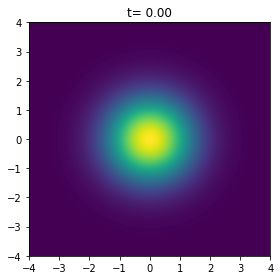

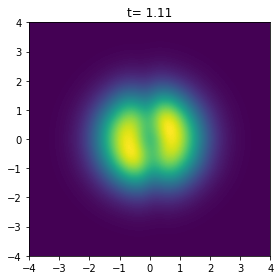

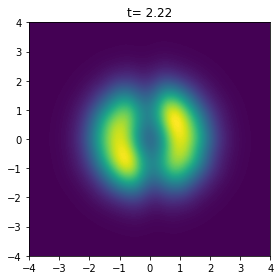

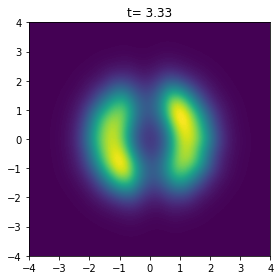

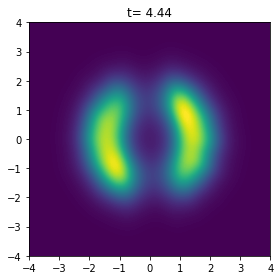

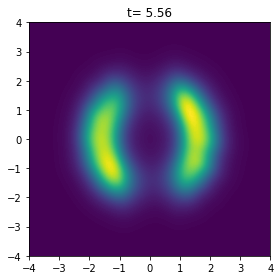

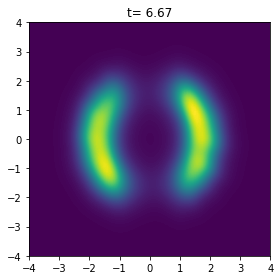

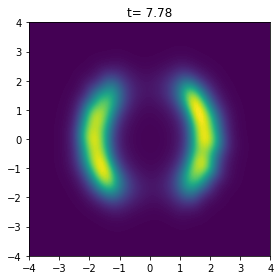

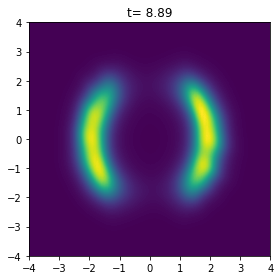

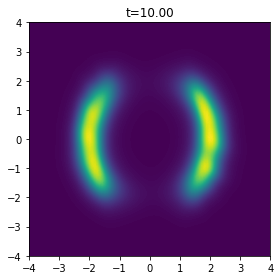

In [28]:
x = np.linspace(-4, 4, 100)
y = np.linspace(-4, 4, 100)
points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T

z_t1 = torch.tensor(points).type(torch.float32).to(device)
logp_diff_t1 = torch.zeros(z_t1.shape[0], 1).type(torch.float32).to(device) 

z_t, logp_diff_t = odeint(
    odefunc,
    (z_t1, logp_diff_t1),
    torch.tensor(np.linspace(t0, t1, 10)).to(device),
    atol=1e-5,
    rtol=1e-5,
    method='dopri5',
)

for step, (t, z, logp_diff) in enumerate(zip(np.linspace(t0, t1, 10), z_t, logp_diff_t)):

    
    logp = norm.log_prob(z) - logp_diff.view(-1)

    plt.figure(figsize=(4, 4))
    plt.title(f"t={t:5.2f}")
    plt.tricontourf(*z_t1.detach().cpu().numpy().T, np.exp(logp.detach().cpu().numpy()), 200)
    plt.tight_layout()
    plt.show()
    plt.savefig(f"cnfs/density/step_{1000 + step}.jpg")
    plt.close()

### Generate diagrams of the potentials

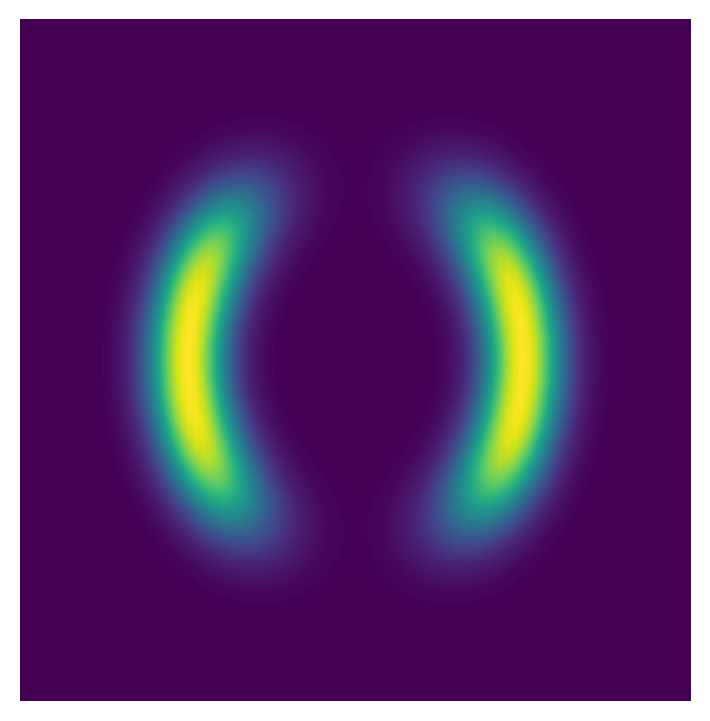

In [19]:
x = np.linspace(-4, 4, 100)
y = np.linspace(-4, 4, 100)
points = np.vstack(np.meshgrid(x, y)).reshape([2, -1]).T

probs = energy_function_1(torch.tensor(points).type(torch.float32)).numpy()
plt.figure(figsize=(4, 4), dpi=200)

plt.tricontourf(points[:, 0], points[:, 1], np.exp(-probs)[:,0], 200)

plt.tight_layout()
plt.axis('off')
plt.gca().invert_yaxis()
plt.margins(0, 0)

plt.savefig(repo_dir + f"/potential1.jpg",
            pad_inches=0, bbox_inches='tight')
# plt.show()